## 为什么学习pandas

numpy能够帮我们处理处理数值型数据，但是这还不够
很多时候，我们的数据除了数值之外，还有字符串，还有时间序列等

numpy能够帮助我们处理数值，但是pandas除了处理数值之外(基于numpy)，还能够帮助我们处理其他类型的数据

### pandas的常用数据类型
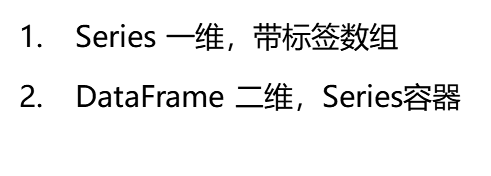

### series

1. 创建series

In [2]:
import string
import pandas as pd
import numpy as np
t = pd.Series(np.arange(10),index=list(string.ascii_uppercase[:10]))
t

A    0
B    1
C    2
D    3
E    4
F    5
G    6
H    7
I    8
J    9
dtype: int32

In [3]:
type(t)

pandas.core.series.Series

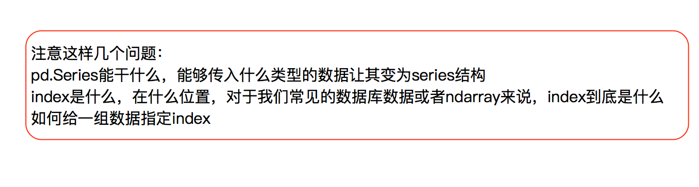

In [4]:
# 通过字典创建Series，Seris中的索引就是字典的key

In [111]:
# 创建字典{},用字典的推导式
a={string.ascii_uppercase[i]:i for i in range(10)}
a

{'A': 0,
 'B': 1,
 'C': 2,
 'D': 3,
 'E': 4,
 'F': 5,
 'G': 6,
 'H': 7,
 'I': 8,
 'J': 9}

In [112]:
pd.Series(a) # 字典的key就是索引，value就是值

A    0
B    1
C    2
D    3
E    4
F    5
G    6
H    7
I    8
J    9
dtype: int64

设置索引
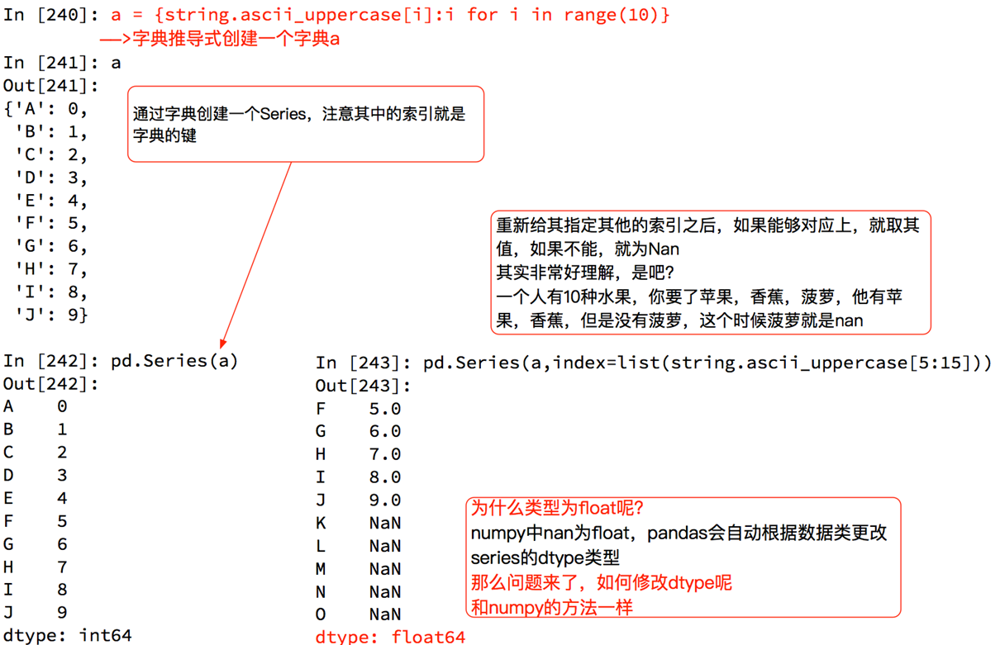

In [113]:
pd.Series(a,index=list(string.ascii_uppercase[5:15]))

F    5.0
G    6.0
H    7.0
I    8.0
J    9.0
K    NaN
L    NaN
M    NaN
N    NaN
O    NaN
dtype: float64

In [114]:
# 修改数据类型
pd.Series(a)

A    0
B    1
C    2
D    3
E    4
F    5
G    6
H    7
I    8
J    9
dtype: int64

In [115]:
pd.Series(a).astype(np.float32)

A    0.0
B    1.0
C    2.0
D    3.0
E    4.0
F    5.0
G    6.0
H    7.0
I    8.0
J    9.0
dtype: float32

## pandas之Series切片和索引

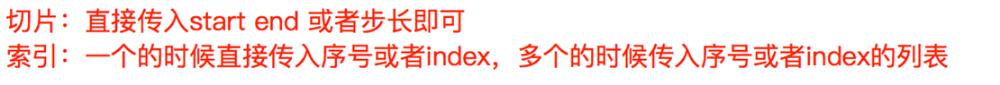

注意：切片或者索引是，如果数据是多个，那么结果也是个Series。如果就一个数据，那么就是值

索引方法：有位置（数字）索引和按index索引

In [116]:
t = pd.Series(a)
t

A    0
B    1
C    2
D    3
E    4
F    5
G    6
H    7
I    8
J    9
dtype: int64

In [119]:
t[0]

0

1. 切片

In [117]:
t[1:10:2]

B    1
D    3
F    5
H    7
J    9
dtype: int64

In [118]:
t[0:10]

A    0
B    1
C    2
D    3
E    4
F    5
G    6
H    7
I    8
J    9
dtype: int64

In [133]:
t['A':'F'] # 左闭右闭

,d,e,f,g


2. 索引

In [22]:
# 单个元素索引：传入序号或者index，注意序号可能和index有冲突
# 有的序号可能被解读为index，但index没有这个值，会报错
t[0]

0

In [29]:
t[5]

5

In [26]:
t['F']

5

In [27]:
# 多个元素索引，传入序号或者index的列表
t[[0,2,4]]

A    0
C    2
E    4
dtype: int64

In [30]:
t[['A','F','E']]

A    0
F    5
E    4
dtype: int64

In [110]:
t=pd.Series(np.arange(10),index=list(range(1,11)))
t[0:1]

1    0
dtype: int32

### 条件索引：和numpy同理，都是将完整的数据结构作为索引，机器可以识别，但是人类书写太过麻烦，所有用索引方式传入，不过最终也会被转为完整的数据结构

In [32]:
t<4

A     True
B     True
C     True
D     True
E    False
F    False
G    False
H    False
I    False
J    False
dtype: bool

In [33]:
t[t<4]

A    0
B    1
C    2
D    3
dtype: int64

### series的属性

In [34]:
t

A    0
B    1
C    2
D    3
E    4
F    5
G    6
H    7
I    8
J    9
dtype: int64

In [35]:
# 获取index
t.index

Index(['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J'], dtype='object')

In [36]:
# 获取值
t.values

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9], dtype=int64)

In [37]:
type(t.index)

pandas.core.indexes.base.Index

In [38]:
type(t.values)

numpy.ndarray

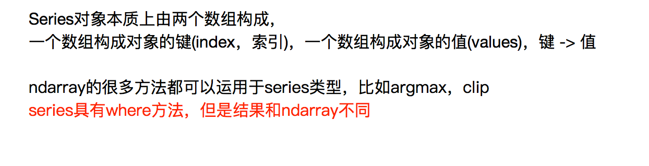

这就意味着对Series的数据进行操作时，由于数据是numpy类型，索引可以用numpy的各种方法

In [41]:
t.max()

9

In [42]:
t.min()

0

In [43]:
t.argmax()

9

In [44]:
t.argmin()

0

In [45]:
t.std()

3.0276503540974917

In [47]:
t.clip(5,7)

A    5
B    5
C    5
D    5
E    5
F    5
G    6
H    7
I    7
J    7
dtype: int64

In [48]:
t.mean()

4.5

In [49]:
t.median()

4.5

### pandas之DataFrame

就是一个表格，是series的容器

In [123]:
t=pd.DataFrame(np.arange(12).reshape(3,4),index=list("abc"),columns=list("defg"))

In [68]:
t

,d,e,f,g
a,0,1,2,3
b,4,5,6,7
c,8,9,10,11


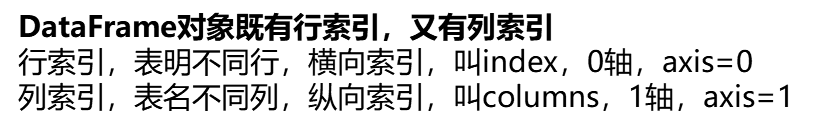

In [54]:
# 可以通过传入列表字典，创建dataframe
# 列表中每个字典都是一条数据(表格中的一行)
a = [{"name":'123',"age":10},{"name":'456','age':20}]
pd.DataFrame(a)

,name,age
0,123,10
1,456,20


In [69]:
# 也可以传入字典列表
# 每个key对应的value是一个列表，即key所对应的列的数据(表格中的一列)
# 后面的插入一列，也是同样的道理：a['key']=[1,2,3,4....]
a = {"name":['123','456'],'age':[10,20]}
pd.DataFrame(a)

,name,age
0,123,10
1,456,20


DataFrame属性
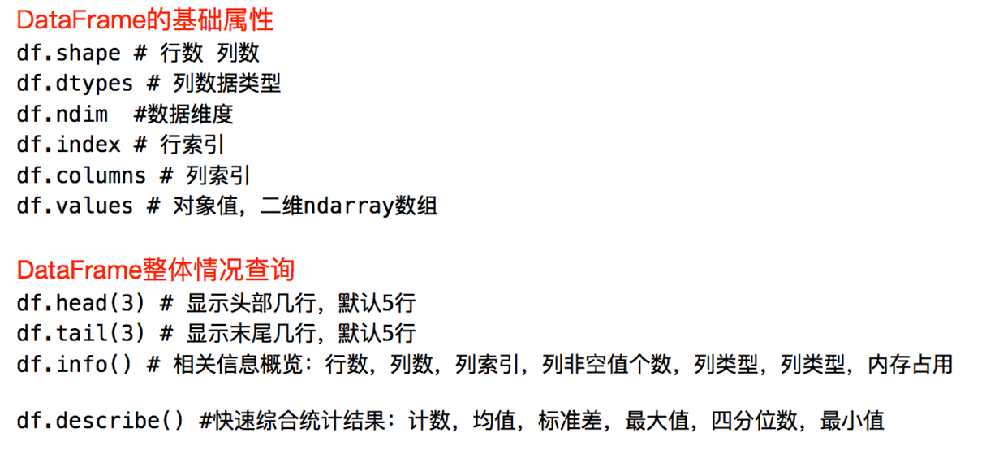

In [70]:
t

,d,e,f,g
a,0,1,2,3
b,4,5,6,7
c,8,9,10,11


In [58]:
t.shape

(2, 2)

In [71]:
t.dtypes # 列数据类型，每一列的数据类型可能不同

d    int32
e    int32
f    int32
g    int32
dtype: object

In [72]:
t.index

Index(['a', 'b', 'c'], dtype='object')

In [73]:
t.values # 返回二维数组

array([[ 0,  1,  2,  3],
       [ 4,  5,  6,  7],
       [ 8,  9, 10, 11]])

In [74]:
t.columns

Index(['d', 'e', 'f', 'g'], dtype='object')

In [75]:
t.head()

,d,e,f,g
a,0,1,2,3
b,4,5,6,7
c,8,9,10,11


In [76]:
t.tail(1)

,d,e,f,g
c,8,9,10,11


In [77]:
t.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3 entries, a to c
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   d       3 non-null      int32
 1   e       3 non-null      int32
 2   f       3 non-null      int32
 3   g       3 non-null      int32
dtypes: int32(4)
memory usage: 72.0+ bytes


In [78]:
t.describe()

,d,e,f,g
count,3.0,3.0,3.0,3.0
mean,4.0,5.0,6.0,7.0
std,4.0,4.0,4.0,4.0
min,0.0,1.0,2.0,3.0
25%,2.0,3.0,4.0,5.0
50%,4.0,5.0,6.0,7.0
75%,6.0,7.0,8.0,9.0
max,8.0,9.0,10.0,11.0


### 对数据进行排序

In [82]:
b = pd.read_csv("housing_clean.csv")
b

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222.0,18.7,396.90,5.33,36.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,0.06263,0.0,11.93,0,0.573,6.593,69.1,2.4786,1,273.0,21.0,391.99,9.67,22.4
502,0.04527,0.0,11.93,0,0.573,6.120,76.7,2.2875,1,273.0,21.0,396.90,9.08,20.6
503,0.06076,0.0,11.93,0,0.573,6.976,91.0,2.1675,1,273.0,21.0,396.90,5.64,23.9
504,0.10959,0.0,11.93,0,0.573,6.794,89.3,2.3889,1,273.0,21.0,393.45,6.48,22.0


In [81]:
# 参数一是选column，多列需要要传入列表, 参数二ascending=True,按升序排列
b1 = b.sort_values(by=["AGE","B"],ascending=False)
b1[:10]

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
141,1.62864,0.0,21.89,0,0.624,5.019,100.0,1.4394,4,437.0,21.2,396.9,34.41,14.4
142,3.32105,0.0,19.58,1,0.871,5.403,100.0,1.3216,5,403.0,14.7,396.9,26.82,13.4
143,4.09740,0.0,19.58,0,0.871,5.468,100.0,1.4118,5,403.0,14.7,396.9,26.42,15.6
209,0.43571,0.0,10.59,1,0.489,5.344,100.0,3.8750,4,277.0,18.6,396.9,23.09,20.0
373,11.10810,0.0,18.10,0,0.668,4.906,100.0,1.1742,24,666.0,20.2,396.9,34.77,13.8
374,18.49820,0.0,18.10,0,0.668,4.138,100.0,1.1370,24,666.0,20.2,396.9,37.97,13.8
382,9.18702,0.0,18.10,0,0.700,5.536,100.0,1.5804,24,666.0,20.2,396.9,23.60,11.3
383,7.99248,0.0,18.10,0,0.700,5.520,100.0,1.5331,24,666.0,20.2,396.9,24.56,12.3
386,24.39380,0.0,18.10,0,0.700,4.652,100.0,1.4672,24,666.0,20.2,396.9,28.28,10.5
398,38.35180,0.0,18.10,0,0.693,5.453,100.0,1.4896,24,666.0,20.2,396.9,30.59,5.0


## pandas之取行或者列

In [95]:
t,t.columns

(   d  e   f   g
 a  0  1   2   3
 b  4  5   6   7
 c  8  9  10  11,
 Index(['d', 'e', 'f', 'g'], dtype='object'))

In [121]:
# 注意index、columns和行号是否会有冲突

In [246]:
# 位序：索引是数字，对行进行索引操作
t[:2] # 前2行

,d,e,f,g
a,100,1,NaN,3.0
b,200,200,NaN,NaN


In [96]:
# 字符串：对列进行索引
t[:2]['d'] #返回series

a    0
b    4
Name: d, dtype: int32

In [248]:
t['e'] # 返回series，取列

a      1
b    200
c      9
Name: e, dtype: int32

In [249]:
t[['e']] # 返回dataframe，多加一个[]表示取多列

,e
a,1
b,200
c,9


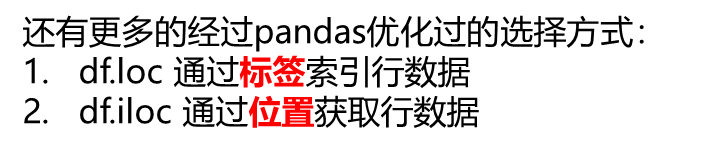

1. 标签索引

注意：标签索引时,'a':'b',此时b也能取到，左闭右闭

In [150]:
t

,d,e,f,g
a,100,1,2,3
b,200,200,6,7
c,8,9,10,11


In [128]:
# [行，列]
t.loc['a','d']

0

In [129]:
t.loc['a',['d','f']] # series类型

d    0
f    2
Name: a, dtype: int32

In [130]:
# 选择间隔的多行多列
t.loc[['a','c'],['d','g']]

,d,g
a,0,3
c,8,11


In [131]:
t.loc['a':,['d','f']]

,d,f
a,0,2
b,4,6
c,8,10


In [132]:
t.loc['a':'c',['e','g']]  

,e,g
a,1,3
b,5,7
c,9,11


2. 按位置获取数据

In [134]:
t.iloc[1:3,[1,2]]

,e,f
b,5,6
c,9,10


In [135]:
t.iloc[1:3,1:3]

,e,f
b,5,6
c,9,10


修改数据

In [136]:
t

,d,e,f,g
a,0,1,2,3
b,4,5,6,7
c,8,9,10,11


In [137]:
t.loc['a','d']=100
t

,d,e,f,g
a,100,1,2,3
b,4,5,6,7
c,8,9,10,11


In [138]:
t.iloc[1:2,0:2]=200
t

,d,e,f,g
a,100,1,2,3
b,200,200,6,7
c,8,9,10,11


### pandas之布尔索引

In [140]:
t.loc[[True,False,False],:]

,d,e,f,g
a,100,1,2,3


In [142]:
t['d']>50

a     True
b     True
c    False
Name: d, dtype: bool

解释：t['d']>50得到完整一列的Series，内部实现会将其转为loc索引的方式，更具series中是否为true，选出那一行

In [146]:
t[t['d']>50]

,d,e,f,g
a,100,1,2,3
b,200,200,6,7


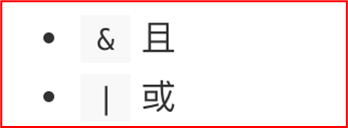

非：~

注意：每个条件判断都要用括号括起来

In [151]:
t[(t['d']>50)&(t['g']>3)]

,d,e,f,g
b,200,200,6,7


In [152]:
t[(t['d']>50)|(t['g']>3)]

,d,e,f,g
a,100,1,2,3
b,200,200,6,7
c,8,9,10,11


In [155]:
t[~(t['d']>50)] # 每层判断都要加上括号

,d,e,f,g
c,8,9,10,11


## 添加列

In [345]:
x= [{"name":'123',"age":10},{"name":'456','age':20}]
x=pd.DataFrame(x,index=list('bc'))
x['score']=np.array([90,91]) # 直接传入一个列表，score相当于key
# 即构建了{'score':[90,91]}这样的一列
x

,name,age,score
b,123,10,90
c,456,20,91


### pandas之字符串方法
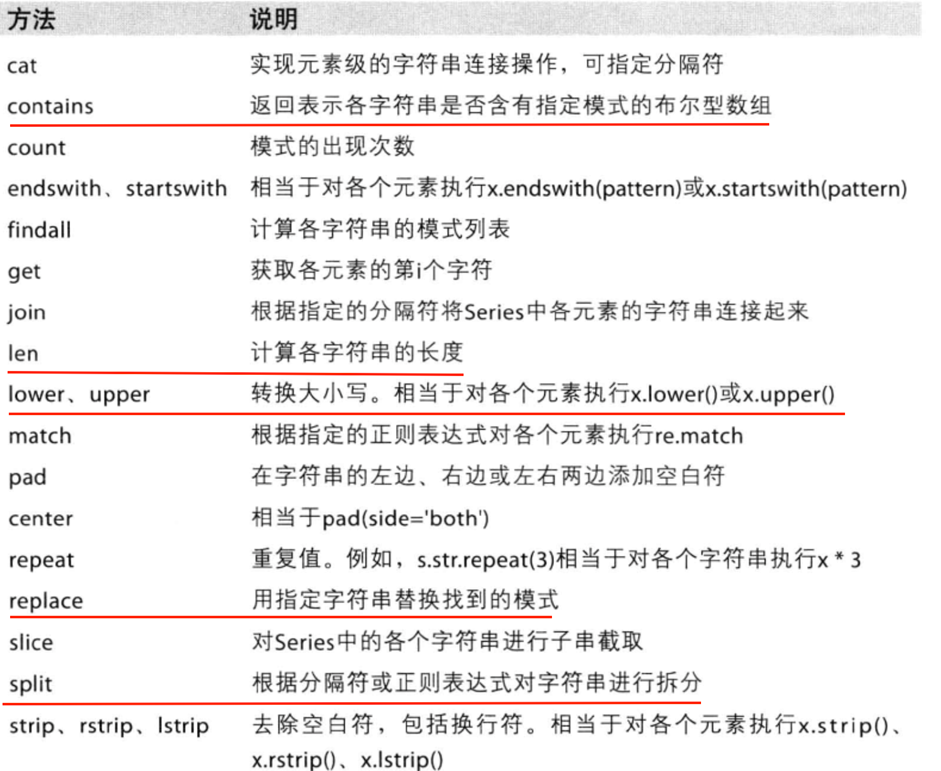

In [156]:
data = pd.read_excel("jd_noodles_comments2024-04-27-02.xls")
data

,用户编号,评论,时间,评论标签
0,20692591148,有机的符合欧盟标准 宝宝吃更放心 比我之前买的另一个牌子煮的更软烂一些 很喜欢吃宝宝 都是一...,2024-04-14 14:11:00,3
1,20688731288,麻麻们！我又挖到宝啦，再也不愁给宝宝做辅食了，这款婴标面条，配料干净，营养丰富，认准婴标，宝...,2024-04-13 11:55:10,3
2,20641428684,哎呀呀，挺好的呀，碎碎面，很方便，不用自己捏碎，娃吃的也还可以，不挑，挺好，搞活动买的，吃完...,2024-03-31 11:48:34,3
3,20682421740,不错非常好，孩子特别喜欢，菠菜面加点鸡蛋弄的软烂非常好，是会回购的，不错真的不错，会推荐别人...,2024-04-11 15:27:02,3
4,20727164942,早上一早下单 下午就到了 京东效率很高 还担心宝宝不爱吃 搭配蔬菜煮的 一口气吃完一袋的量 ...,2024-04-23 21:47:38,3
...,...,...,...,...
3053,15433310041,此用户未填写评价内容,2021-03-18 09:23:16,1
3054,15365620468,吃完拉肚子，每次都是，不出就好了,2021-03-01 11:10:15,1
3055,14868922701,如果可以一颗星都不想给，以为小皮是大品牌同时也相信京东自营，来了以后刚打开就发现被拆开了 客...,2020-11-09 17:35:42,1
3056,14801434334,很垃圾 一点味没有,2020-10-26 20:21:09,1


In [160]:
# 字符串长度
data['评论'].str.len()

0       73
1       84
2       66
3       63
4       61
        ..
3053    10
3054    16
3055    68
3056     9
3057     1
Name: 评论, Length: 3058, dtype: int64

In [162]:
# 去除字符串两边的空白字符、换行符
data['评论'].str.strip()

0       有机的符合欧盟标准 宝宝吃更放心 比我之前买的另一个牌子煮的更软烂一些 很喜欢吃宝宝 都是一...
1       麻麻们！我又挖到宝啦，再也不愁给宝宝做辅食了，这款婴标面条，配料干净，营养丰富，认准婴标，宝...
2       哎呀呀，挺好的呀，碎碎面，很方便，不用自己捏碎，娃吃的也还可以，不挑，挺好，搞活动买的，吃完...
3       不错非常好，孩子特别喜欢，菠菜面加点鸡蛋弄的软烂非常好，是会回购的，不错真的不错，会推荐别人...
4       早上一早下单 下午就到了 京东效率很高 还担心宝宝不爱吃 搭配蔬菜煮的 一口气吃完一袋的量 ...
                              ...                        
3053                                           此用户未填写评价内容
3054                                     吃完拉肚子，每次都是，不出就好了
3055    如果可以一颗星都不想给，以为小皮是大品牌同时也相信京东自营，来了以后刚打开就发现被拆开了 客...
3056                                            很垃圾 一点味没有
3057                                                     
Name: 评论, Length: 3058, dtype: object

### 数据缺失通常有两种情况：
1. 一种就是空，None等，在pandas是NaN(和np.nan一样)
2. 另一种是我们让其为0


### 缺失数据的处理
1. 处理方式1：删除NaN所在的行列dropna (axis=0, how='any', inplace=False)
2. 处理方式2：填充数据，t.fillna(t.mean()),t.fiallna(t.median()),t.fillna(0)


In [165]:
# 1.判断数据是否为nan
t

,d,e,f,g
a,100,1,2,3
b,200,200,6,7
c,8,9,10,11


In [169]:
# 设置nan
t.loc['a':'b','f']=np.nan
t

,d,e,f,g
a,100,1,NaN,3
b,200,200,NaN,7
c,8,9,10.0,11


In [192]:
pd.isnull(t)

,d,e,f,g
a,False,False,True,False
b,False,False,True,True
c,False,False,True,True


In [171]:
# 2. 判断数据不是nan
pd.notnull(t)

,d,e,f,g
a,True,True,False,True
b,True,True,False,True
c,True,True,True,True


### 法一、删除nan所在的行/列

In [346]:
t.dropna(axis=0,how='any',inplace=False) 
# how=all/any，其中all是当前行所有值都为nan，any是只要有nan就删除

,d,e,f,g


### 法二、填充


In [189]:
t.fillna(t.mean(),axis=0) # 按列找到缺失值，找到后填充该列的平均值

,d,e,f,g
a,100,1,NaN,3.0
b,200,200,NaN,3.0
c,8,9,NaN,3.0


In [178]:
t.fillna(t.median(),axis=0)

,d,e,f,g
a,100,1,10.0,3
b,200,200,10.0,7
c,8,9,10.0,11


In [179]:
t.fillna(0,axis=0)

,d,e,f,g
a,100,1,0.0,3
b,200,200,0.0,7
c,8,9,10.0,11


### 处理为0的数据：t[t==0]=np.nan
因为：计算平均值等情况，nan是不参与计算的，但是0会

In [183]:
# 让为0的数赋值为nan，然后拿处理nan的处理思路来处理
t.iloc[1:3,2:4]=0
t

,d,e,f,g
a,100,1,NaN,3
b,200,200,0.0,0
c,8,9,0.0,0


In [184]:
t[t==0]=np.nan
t

,d,e,f,g
a,100,1,NaN,3.0
b,200,200,NaN,NaN
c,8,9,NaN,NaN


In [190]:
t.fillna(t.mean(),axis=0)

,d,e,f,g
a,100,1,NaN,3.0
b,200,200,NaN,3.0
c,8,9,NaN,3.0


### pandas常用统计方法

In [197]:
data = pd.read_csv('directory.csv')
data

,Brand,Store Number,Store Name,Ownership Type,Street Address,City,State/Province,Country,Postcode,Phone Number,Timezone,Longitude,Latitude
0,Starbucks,47370-257954,"Meritxell, 96",Licensed,"Av. Meritxell, 96",Andorra la Vella,7,AD,AD500,376818720,GMT+1:00 Europe/Andorra,1.53,42.51
1,Starbucks,22331-212325,Ajman Drive Thru,Licensed,"1 Street 69, Al Jarf",Ajman,AJ,AE,NaN,NaN,GMT+04:00 Asia/Dubai,55.47,25.42
2,Starbucks,47089-256771,Dana Mall,Licensed,Sheikh Khalifa Bin Zayed St.,Ajman,AJ,AE,NaN,NaN,GMT+04:00 Asia/Dubai,55.47,25.39
3,Starbucks,22126-218024,Twofour 54,Licensed,Al Salam Street,Abu Dhabi,AZ,AE,NaN,NaN,GMT+04:00 Asia/Dubai,54.38,24.48
4,Starbucks,17127-178586,Al Ain Tower,Licensed,"Khaldiya Area, Abu Dhabi Island",Abu Dhabi,AZ,AE,NaN,NaN,GMT+04:00 Asia/Dubai,54.54,24.51
...,...,...,...,...,...,...,...,...,...,...,...,...,...
25595,Starbucks,21401-212072,Rex,Licensed,"141 Nguyễn Huệ, Quận 1, Góc đường Pasteur và L...",Thành Phố Hồ Chí Minh,SG,VN,70000,08 3824 4668,GMT+000000 Asia/Saigon,106.70,10.78
25596,Starbucks,24010-226985,Panorama,Licensed,"SN-44, Tòa Nhà Panorama, 208 Trần Văn Trà, Quận 7",Thành Phố Hồ Chí Minh,SG,VN,70000,08 5413 8292,GMT+000000 Asia/Saigon,106.71,10.72
25597,Starbucks,47608-253804,Rosebank Mall,Licensed,"Cnr Tyrwhitt and Cradock Avenue, Rosebank",Johannesburg,GT,ZA,2194,27873500159,GMT+000000 Africa/Johannesburg,28.04,-26.15
25598,Starbucks,47640-253809,Menlyn Maine,Licensed,"Shop 61B, Central Square, Cnr Aramist & Coroba...",Menlyn,GT,ZA,181,NaN,GMT+000000 Africa/Johannesburg,28.28,-25.79


In [198]:
data['Longitude'].mean()

-27.872234462283355

In [199]:
data['Longitude'].max()

176.92

In [202]:
data['Longitude'].min()

-159.46

In [200]:
data['Longitude'].argmax()

10033

In [204]:
data['Longitude'].median()

-79.35

## 拼接
1. 行拼接
2. 列拼接

join:默认情况下他是把行索引相同的数据合并到一起
    
行拼接 join

In [213]:
t

,d,e,f,g
a,100,1,NaN,3.0
b,200,200,NaN,NaN
c,8,9,NaN,NaN


In [211]:
a=pd.DataFrame({'h':10,'i':5,'j':121,'k':4},index=['a'])
a

,h,i,j,k
a,10,5,121,4


In [212]:
# 列拼接 merge
t.join(a)

,d,e,f,g,h,i,j,k
a,100,1,NaN,3.0,10.0,5.0,121.0,4.0
b,200,200,NaN,NaN,NaN,NaN,NaN,NaN
c,8,9,NaN,NaN,NaN,NaN,NaN,NaN


数据合并之merge

merge:按照指定的列把数据按照一定的方式合并到一起
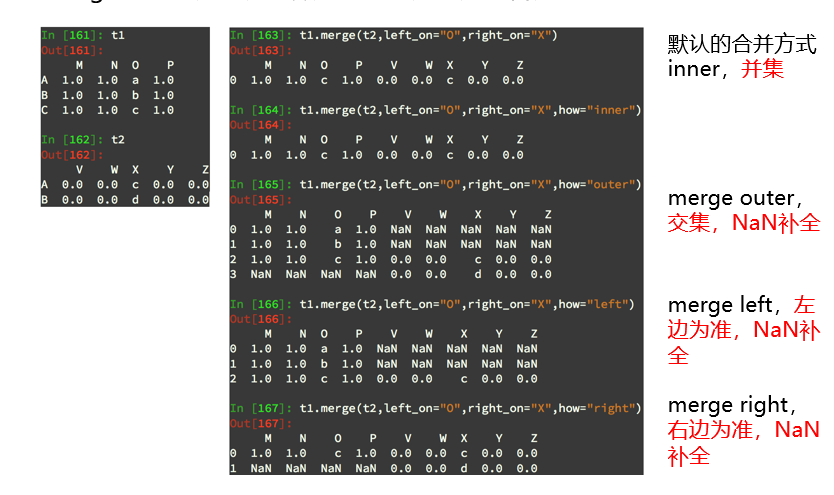

## 分组和聚合

In [215]:
data

,Brand,Store Number,Store Name,Ownership Type,Street Address,City,State/Province,Country,Postcode,Phone Number,Timezone,Longitude,Latitude
0,Starbucks,47370-257954,"Meritxell, 96",Licensed,"Av. Meritxell, 96",Andorra la Vella,7,AD,AD500,376818720,GMT+1:00 Europe/Andorra,1.53,42.51
1,Starbucks,22331-212325,Ajman Drive Thru,Licensed,"1 Street 69, Al Jarf",Ajman,AJ,AE,NaN,NaN,GMT+04:00 Asia/Dubai,55.47,25.42
2,Starbucks,47089-256771,Dana Mall,Licensed,Sheikh Khalifa Bin Zayed St.,Ajman,AJ,AE,NaN,NaN,GMT+04:00 Asia/Dubai,55.47,25.39
3,Starbucks,22126-218024,Twofour 54,Licensed,Al Salam Street,Abu Dhabi,AZ,AE,NaN,NaN,GMT+04:00 Asia/Dubai,54.38,24.48
4,Starbucks,17127-178586,Al Ain Tower,Licensed,"Khaldiya Area, Abu Dhabi Island",Abu Dhabi,AZ,AE,NaN,NaN,GMT+04:00 Asia/Dubai,54.54,24.51
...,...,...,...,...,...,...,...,...,...,...,...,...,...
25595,Starbucks,21401-212072,Rex,Licensed,"141 Nguyễn Huệ, Quận 1, Góc đường Pasteur và L...",Thành Phố Hồ Chí Minh,SG,VN,70000,08 3824 4668,GMT+000000 Asia/Saigon,106.70,10.78
25596,Starbucks,24010-226985,Panorama,Licensed,"SN-44, Tòa Nhà Panorama, 208 Trần Văn Trà, Quận 7",Thành Phố Hồ Chí Minh,SG,VN,70000,08 5413 8292,GMT+000000 Asia/Saigon,106.71,10.72
25597,Starbucks,47608-253804,Rosebank Mall,Licensed,"Cnr Tyrwhitt and Cradock Avenue, Rosebank",Johannesburg,GT,ZA,2194,27873500159,GMT+000000 Africa/Johannesburg,28.04,-26.15
25598,Starbucks,47640-253809,Menlyn Maine,Licensed,"Shop 61B, Central Square, Cnr Aramist & Coroba...",Menlyn,GT,ZA,181,NaN,GMT+000000 Africa/Johannesburg,28.28,-25.79


In [223]:
grouped = data.groupby(by='Country')
grouped

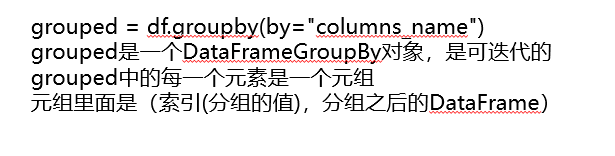

这个对象可以进行遍历、使用聚合函数

In [220]:
# 遍历

In [221]:
for i,j in grouped:
    print(i)
    print("-"*100)
    print(j)
    print("*"*100)

's-Hertogenbosch
----------------------------------------------------------------------------------------------------
          Brand  Store Number                  Store Name Ownership Type  \
9946  Starbucks  17809-180288  Den Bosch Centraal Station       Licensed   

         Street Address              City State/Province Country Postcode  \
9946  Stationsplein 137  's-Hertogenbosch             NB      NL  5211 BM   

     Phone Number                   Timezone  Longitude  Latitude  
9946          NaN  GMT+1:00 Europe/Amsterdam        5.3     51.69  
****************************************************************************************************
1~2F
----------------------------------------------------------------------------------------------------
          Brand  Store Number             Store Name Ownership Type  \
8819  Starbucks  29936-255927  Chuncheon Hupyeong DT  Joint Venture   

                Street Address  City State/Province Country Postcode  \
8819  700, Hupye

22705     33.53  
****************************************************************************************************
Airdrie
----------------------------------------------------------------------------------------------------
         Brand  Store Number                  Store Name Ownership Type  \
466  Starbucks  19451-192064            Kingsview Market  Company Owned   
467  Starbucks   4808-103498              Sierra Springs  Company Owned   
468  Starbucks   4937-124045             Tower Lane Mall  Company Owned   
469  Starbucks   74745-97386        Safeway-Airdrie #281       Licensed   
470  Starbucks   4997-137066            Dickson Crossing  Company Owned   
471  Starbucks  49107-265792  Save On Foods East Airdrie       Licensed   

                                  Street Address     City State/Province  \
466                   2100 Market Street SE, 101  Airdrie             AB   
467                 101 114 Sierra Springs Drive  Airdrie             AB   
468  505 Main Stre

12667  GMT-08:00 America/Los_Angeles    -122.25     38.18  
****************************************************************************************************
American Fork
----------------------------------------------------------------------------------------------------
           Brand  Store Number                       Store Name  \
24081  Starbucks  24500-237076  American Fork - 500 E and State   

      Ownership Type      Street Address           City State/Province  \
24081  Company Owned  496 E State Street  American Fork             UT   

      Country Postcode Phone Number                  Timezone  Longitude  \
24081      US    84003   8013807114  GMT-07:00 America/Denver    -111.79   

       Latitude  
24081     40.37  
****************************************************************************************************
Amersfoort
----------------------------------------------------------------------------------------------------
          Brand  Store Number     Stor

12157     33.42  
****************************************************************************************************
Apex
----------------------------------------------------------------------------------------------------
           Brand  Store Number                 Store Name Ownership Type  \
19831  Starbucks   72999-98079     Harris Teeter-Apex #58       Licensed   
19832  Starbucks  72522-104988           Kroger-Apex #357       Licensed   
19833  Starbucks   76255-94937  Super Target Apex ST-1932       Licensed   

                     Street Address  City State/Province Country   Postcode  \
19831             750 W Williams St  Apex             NC      US  275025100   
19832                 940 US Hwy 64  Apex             NC      US  275237184   
19833  1201 Beaver Creek Commons Dr  Apex             NC      US  275023922   

       Phone Number                    Timezone  Longitude  Latitude  
19831  919-362-3782  GMT-05:00 America/New_York     -78.86     35.74  
19832  919-

10028  GMT+12:00 Pacific/Auckland     174.73    -36.88  
****************************************************************************************************
Augusta
----------------------------------------------------------------------------------------------------
           Brand  Store Number                      Store Name Ownership Type  \
16968  Starbucks  73904-108009         Kroger-Augusta, GA #676       Licensed   
16969  Starbucks  76760-108189           Target Augusta T-1090       Licensed   
16970  Starbucks  11350-104272       Wrightsboro Rd & Capps St  Company Owned   
16971    Teavana  28678-250159          Teavana - Augusta Mall  Company Owned   
16972  Starbucks  47388-257447  Bobby Jones and Old Trail Road  Company Owned   
16973  Starbucks  49033-244525           Kroger - Augusta #644       Licensed   
16974  Starbucks    9556-94235               I-20 & Washington  Company Owned   
16975  Starbucks  10952-103581                    Augusta Mall  Company Owned   
1697

19579  GMT-06:00 America/Chicago     -90.54     38.59  
****************************************************************************************************
Baltimore
----------------------------------------------------------------------------------------------------
           Brand  Store Number                           Store Name  \
18835  Starbucks  20625-206744         Target Baltimore East T-2845   
18836  Starbucks   72219-25328    Baltimore Convention Center-Lobby   
18837  Starbucks  11685-105197               1209 N. Charles Street   
18838  Starbucks  27684-248006            BWI - Baggage Claim SW AB   
18839  Starbucks  21409-178825       Embassy Suites Hotel-Baltimore   
18840  Starbucks  16798-159608                  100 E. Pratt Street   
18841  Starbucks   3569-145464  Loyola Universi-Andrew White Center   
18842  Starbucks       746-590                Mount Washington Mill   
18843  Starbucks       731-974                       6378 York Road   
18844  Starbucks   741

19397  218-828-2978  GMT-06:00 America/Chicago     -94.25     46.37  
****************************************************************************************************
Bay City
----------------------------------------------------------------------------------------------------
           Brand  Store Number Store Name Ownership Type      Street Address  \
19133  Starbucks  23156-222525   Bay City  Company Owned  4107 Wilder Rd, #2   

           City State/Province Country Postcode  Phone Number  \
19133  Bay City             MI      US    48706  989-545-2689   

                         Timezone  Longitude  Latitude  
19133  GMT-05:00 America/New_York     -83.89     43.62  
****************************************************************************************************
Bay Lake
----------------------------------------------------------------------------------------------------
           Brand  Store Number                           Store Name  \
16194  Starbucks  22364-193144 

12103      4792952992  GMT-06:00 America/Chicago     -94.25     36.36  
****************************************************************************************************
Beppu
----------------------------------------------------------------------------------------------------
          Brand  Store Number    Store Name Ownership Type  Street Address  \
7940  Starbucks  30802-102739  Beppu TOKIWA  Joint Venture  2-9-1 Kitahama   

       City State/Province Country  Postcode Phone Number  \
7940  Beppu             44      JP  874-8558          NaN   

                  Timezone  Longitude  Latitude  
7940  GMT+09:00 Asia/Tokyo     131.51     33.28  
****************************************************************************************************
Berchem
----------------------------------------------------------------------------------------------------
          Brand  Store Number                          Store Name  \
9116  Starbucks  28143-243617  Aire de Berchem - Shell (autor

24244     -80.42     37.23  
****************************************************************************************************
Blaine
----------------------------------------------------------------------------------------------------
           Brand  Store Number                   Store Name Ownership Type  \
19399  Starbucks   76115-88842  Super Target Blaine ST-1832       Licensed   
19400  Starbucks  20107-189627    109th and Hwy 65 - Blaine  Company Owned   

               Street Address    City State/Province Country   Postcode  \
19399       1500 109th Ave NE  Blaine             MN      US  554494670   
19400  1384 109th Avenue, 100  Blaine             MN      US      55434   

       Phone Number                   Timezone  Longitude  Latitude  
19399  763-354-1000  GMT-06:00 America/Chicago     -93.23     45.17  
19400    7637676833  GMT-06:00 America/Chicago     -93.24     45.17  
*******************************************************************************************

18889     38.94  
****************************************************************************************************
Bowling Green
----------------------------------------------------------------------------------------------------
           Brand  Store Number                       Store Name  \
18349  Starbucks  13758-108076                Campbell & Hwy 31   
18350  Starbucks  48055-259284               Stadium Park Plaza   
18351  Starbucks  15957-157366      Western Kentucky University   
18352  Starbucks    2707-82844          Hwy 231 - Bowling Green   
18353  Starbucks  26004-237601       Kroger Bowling Green # 535   
21539  Starbucks   75259-90428  Bowling Green U - Student Union   
21540  Starbucks  10786-102047     Bowling Green - E Wooster St   
21541  Starbucks   72861-74448        Kroger-Bowling Green #878   

      Ownership Type                             Street Address  \
18349  Company Owned                          710 Campbell Lane   
18350       Licensed        

          Brand  Store Number                        Store Name  \
5431  Starbucks  12904-137732  Bromley - Glades Shopping Centre   
5432  Starbucks   12582-97442               Bromley High Street   
5433  Starbucks   12088-11316           Bromley - Market Square   

     Ownership Type                              Street Address     City  \
5431  Company Owned  Bromley - Glades Shopping Centre, unit 220  Bromley   
5432  Company Owned                              31 High Street  Bromley   
5433  Company Owned                            25 Market Square  Bromley   

     State/Province Country Postcode Phone Number                Timezone  \
5431            ENG      GB  BR1 1DN   2083139564  GMT+0:00 Europe/London   
5432            ENG      GB  BR1 1LG   2084642975  GMT+0:00 Europe/London   
5433            ENG      GB  BR1 1NA   2084606656  GMT+0:00 Europe/London   

      Longitude  Latitude  
5431       0.02     51.40  
5432       0.02     51.40  
5433       0.02     51.41  
*****

5437     51.26  
****************************************************************************************************
Burr Ridge
----------------------------------------------------------------------------------------------------
           Brand  Store Number                        Store Name  \
17503  Starbucks  13442-106592  Burr Ridge-I-55 & County Line Rd   

      Ownership Type          Street Address        City State/Province  \
17503  Company Owned  515 Village Center Dr.  Burr Ridge             IL   

      Country   Postcode  Phone Number                   Timezone  Longitude  \
17503      US  605274516  630-887-4695  GMT-06:00 America/Chicago     -87.91   

       Latitude  
17503     41.75  
****************************************************************************************************
Bursa
----------------------------------------------------------------------------------------------------
           Brand  Store Number    Store Name Ownership Type  \
11326  Starbuc

12879  GMT-08:00 America/Los_Angeles    -120.97     38.66  
****************************************************************************************************
Camp Hill
----------------------------------------------------------------------------------------------------
           Brand  Store Number              Store Name Ownership Type  \
22351  Starbucks    8966-94758   Camp Hill Trindle Rd.  Company Owned   
22352  Starbucks  11740-106146       Capital City Mall  Company Owned   
22353  Starbucks  27550-189471  Giant Camp Hill # 6269       Licensed   

                                 Street Address       City State/Province  \
22351      3200 Trindle Road, Capital City Mall  Camp Hill             PA   
22352  3981 Capital City Mall Drive, Space FK#1  Camp Hill             PA   
22353                           3301 Trindle Rd  Camp Hill             PA   

      Country   Postcode  Phone Number                    Timezone  Longitude  \
22351      US  170114429  717-737-9304  GMT-0

5453  GMT+0:00 Europe/London      -1.34     53.71  
****************************************************************************************************
Castlegar
----------------------------------------------------------------------------------------------------
         Brand Store Number              Store Name Ownership Type  \
794  Starbucks  5031-147306  Safeway-Castlegar #196       Licensed   

                                    Street Address       City State/Province  \
794  1721 Columbia Ave, Promontory Shopping Centre  Castlegar             BC   

    Country Postcode  Phone Number                     Timezone  Longitude  \
794      CA  V1N 2W6  250-365-7771  GMT-08:00 America/Vancouver    -117.66   

     Latitude  
794      49.3  
****************************************************************************************************
Castro Valley
----------------------------------------------------------------------------------------------------
           Brand  Store Numbe

24267  GMT-05:00 America/New_York     -78.44     38.13  
****************************************************************************************************
Charlottetown
----------------------------------------------------------------------------------------------------
          Brand  Store Number                  Store Name Ownership Type  \
1795  Starbucks  26842-243424  University & Buchanan Ave.  Company Owned   
1796  Starbucks  21396-212188             65 Queen Street  Company Owned   

       Street Address           City State/Province Country Postcode  \
1795   655 University  Charlottetown             PE      CA  C1E 1E5   
1796  65 Queen Street  Charlottetown             PE      CA  C1A 4A6   

       Phone Number                   Timezone  Longitude  Latitude  
1795   902-892-1847  GMT-04:00 America/Halifax     -63.15     46.26  
1796  (902)892-8969  GMT-04:00 America/Halifax     -63.13     46.23  
***********************************************************************

12203  928-636-8358  GMT+000000 America/Phoenix    -112.45     34.76  
****************************************************************************************************
Chiryu
----------------------------------------------------------------------------------------------------
          Brand Store Number             Store Name Ownership Type  \
7516  Starbucks  30290-62842  GALLERIA APITA Chiryu  Joint Venture   

               Street Address    City State/Province Country  Postcode  \
7516  18-1 Oyama Nagashinocho  Chiryu             23      JP  472-0045   

     Phone Number              Timezone  Longitude  Latitude  
7516          NaN  GMT+09:00 Asia/Tokyo     137.05      35.0  
****************************************************************************************************
Chiswell Green
----------------------------------------------------------------------------------------------------
          Brand  Store Number                         Store Name  \
5468  Starbucks  12

22730     34.68  
****************************************************************************************************
Clermont
----------------------------------------------------------------------------------------------------
           Brand  Store Number                        Store Name  \
16254  Starbucks  11249-103362                   SR 50 & Hancock   
16255  Starbucks   76103-78187     Super Target Clermont ST-1519   
16256  Starbucks  13969-109205  US Hwy 27 & Cagan Crossings Blvd   

      Ownership Type      Street Address      City State/Province Country  \
16254  Company Owned   2573 E Highway 50  Clermont             FL      US   
16255       Licensed       2660 E Hwy 50  Clermont             FL      US   
16256  Company Owned  628 Cagan View Rd.  Clermont             FL      US   

        Postcode  Phone Number                    Timezone  Longitude  \
16254  347116051  352 243-0419  GMT-05:00 America/New_York     -81.71   
16255  347116034  352-394-8510  GMT-05:00 A

21664      GMT-05:00 America/New_York     -83.00     39.96  
****************************************************************************************************
Colville
----------------------------------------------------------------------------------------------------
           Brand  Store Number               Store Name Ownership Type  \
24732  Starbucks  70368-139826  Safeway - Colville #385       Licensed   

          Street Address      City State/Province Country   Postcode  \
24732  391 North Main St  Colville             WA      US  991142309   

      Phone Number                       Timezone  Longitude  Latitude  
24732          NaN  GMT-08:00 America/Los_Angeles    -117.91     48.55  
****************************************************************************************************
Commack
----------------------------------------------------------------------------------------------------
           Brand  Store Number             Store Name Ownership Type  \
20977 

22013  GMT-08:00 America/Los_Angeles    -123.26     44.58  
****************************************************************************************************
Cos Cob
----------------------------------------------------------------------------------------------------
           Brand Store Number Store Name Ownership Type  \
15952  Starbucks    7824-2544    Cos Cob  Company Owned   

                                  Street Address     City State/Province  \
15952  147 East Putnam Avenue, Danbury Fair Mall  Cos Cob             CT   

      Country Postcode  Phone Number                    Timezone  Longitude  \
15952      US     6807  203-661-1543  GMT-05:00 America/New_York      -73.6   

       Latitude  
15952     41.04  
****************************************************************************************************
Costa Mesa
----------------------------------------------------------------------------------------------------
           Brand  Store Number                    

9785  GMT+08:00 Asia/Kuala_Lumpur     101.65      2.90  
****************************************************************************************************
Cypress
----------------------------------------------------------------------------------------------------
           Brand  Store Number                Store Name Ownership Type  \
13087  Starbucks     5817-5525        Katella & Meridian  Company Owned   
13088  Starbucks  21423-211904      Target Cypress T-229       Licensed   
13089  Starbucks   10131-99101        Valley View & Ball  Company Owned   
13090  Starbucks  19834-195005    Ralph's - Cypress #233       Licensed   
23216  Starbucks   10297-96582  Hwy 290 & Spring Cypress  Company Owned   
23217  Starbucks  14651-118844   Houston Premium Outlets  Company Owned   
23218  Starbucks  29006-236927   Kroger - Fairfield #179       Licensed   
23219  Starbucks  22594-201735     Kroger - Cypress #115       Licensed   
23220  Starbucks   76293-90360     Target Cypress T-1894  

21679     GMT-05:00 America/New_York     -84.18     39.74  
****************************************************************************************************
Daytona Beach
----------------------------------------------------------------------------------------------------
           Brand  Store Number                   Store Name Ownership Type  \
16284  Starbucks  13970-109626           ISB & Clyde Morris  Company Owned   
16285  Starbucks   8443-209184                 A1A & Harvey  Company Owned   
16286  Starbucks   76336-89123   Target Daytona Beach T-688       Licensed   
16287  Starbucks  78092-119269  Embry-Riddle Student Center       Licensed   

                                          Street Address           City  \
16284  1388 W International Speedway Boulevard, Suite...  Daytona Beach   
16285                                   110 S. Ocean Ave  Daytona Beach   
16286                    2380 W International Spdwy Blvd  Daytona Beach   
16287                            

23329  281-337-6502  GMT-06:00 America/Chicago     -95.08     29.45  
****************************************************************************************************
Dickson City
----------------------------------------------------------------------------------------------------
           Brand Store Number    Store Name Ownership Type  \
22370  Starbucks   2955-92701  Dickson City  Company Owned   

                                   Street Address          City  \
22370  1152 Commerce Blvd., Suite 101, Barn Plaza  Dickson City   

      State/Province Country   Postcode  Phone Number  \
22370             PA      US  185191279  570-489-9630   

                         Timezone  Longitude  Latitude  
22370  GMT-05:00 America/New_York     -75.64     41.47  
****************************************************************************************************
Dieppe
----------------------------------------------------------------------------------------------------
          Brand  

23330  972-780-0792  GMT-06:00 America/Chicago     -96.92     32.65  
****************************************************************************************************
Dundas
----------------------------------------------------------------------------------------------------
          Brand  Store Number    Store Name Ownership Type  \
1317  Starbucks  15722-155290  46 King St W  Company Owned   

              Street Address    City State/Province Country Postcode  \
1317  46 King Street West, 1  Dundas             ON      CA  L9H 1T5   

      Phone Number                   Timezone  Longitude  Latitude  
1317  905-627-0934  GMT-05:00 America/Toronto     -79.96     43.27  
****************************************************************************************************
Dundee
----------------------------------------------------------------------------------------------------
          Brand Store Number         Store Name Ownership Type  \
6159  Starbucks  12138-15516  Dundee -

9516  GMT-06:00 America/Mexico_City     -99.02     19.56  
****************************************************************************************************
Eden Prairie
----------------------------------------------------------------------------------------------------
           Brand  Store Number                           Store Name  \
19439  Starbucks     2366-7808   Hwy 169 and Anderson Lakes Parkway   
19440  Starbucks     2325-2482             582 Prairie Center Drive   
19441  Starbucks  26250-243426                     62 and Shady Oak   
19442    Teavana  28331-250065        Teavana - Eden Prairie Center   
19443  Starbucks    2599-47139  930 Prairie Center Dr- Eden Prairie   

      Ownership Type                                     Street Address  \
19439  Company Owned                        9639 Anderson Lakes Parkway   
19440  Company Owned                       582 PRAIRIE CENTER DR., #260   
19441  Company Owned      TBD Hwy 62 and Shady Oak, Eden Prairie Center   

****************************************************************************************************
Elmira
----------------------------------------------------------------------------------------------------
           Brand  Store Number      Store Name Ownership Type Street Address  \
20998  Starbucks  28125-248127  Elmira College       Licensed      1 Park Pl   

         City State/Province Country Postcode Phone Number  \
20998  Elmira             NY      US    14901   6077351875   

                         Timezone  Longitude  Latitude  
20998  GMT-05:00 America/New_York     -76.82      42.1  
****************************************************************************************************
Elstree
----------------------------------------------------------------------------------------------------
          Brand  Store Number       Store Name Ownership Type  \
5514  Starbucks  32727-140305  Village Elstree       Licensed   

                          Street Address     City 

24337  GMT-05:00 America/New_York     -77.51     38.29  
****************************************************************************************************
FREEHOLD
----------------------------------------------------------------------------------------------------
         Brand  Store Number                  Store Name Ownership Type  \
20355  Teavana  28355-249803  Teavana - Freehold Raceway  Company Owned   

             Street Address      City State/Province Country Postcode  \
20355  3710 ROUTE 9, #C-114  FREEHOLD             NJ      US     7728   

       Phone Number                    Timezone  Longitude  Latitude  
20355  732-308-0050  GMT-05:00 America/New_York     -74.29     40.26  
****************************************************************************************************
FREEPORT
----------------------------------------------------------------------------------------------------
           Brand  Store Number              Store Name Ownership Type  \
21018  S

22749     -79.81     34.19  
****************************************************************************************************
Florham Park
----------------------------------------------------------------------------------------------------
           Brand Store Number    Store Name Ownership Type  \
20341  Starbucks      859-558  Florham Park  Company Owned   

              Street Address          City State/Province Country  Postcode  \
20341  184 Columbia Turnpike  Florham Park             NJ      US  79321314   

       Phone Number                    Timezone  Longitude  Latitude  
20341  973-443-0484  GMT-05:00 America/New_York     -74.39     40.79  
****************************************************************************************************
Florida City
----------------------------------------------------------------------------------------------------
           Brand  Store Number          Store Name Ownership Type  \
16312  Starbucks  13939-108784  76 East Palm D

18935  301-965-6000  GMT-05:00 America/New_York      -77.0     38.72  
****************************************************************************************************
Fort Wayne
----------------------------------------------------------------------------------------------------
           Brand  Store Number                         Store Name  \
18088  Starbucks  22895-223904           Kroger - Fort Wayne #972   
18089  Starbucks   72833-74343            Meijers-Fort Wayne #138   
18090  Starbucks  76688-102490  Target Ft. Wayne/Glenbrook T-2217   
18091  Starbucks   76276-93281           Target Fort Wayne T-1933   
18092  Starbucks  11502-104427               Coliseum & Coldwater   
18093  Starbucks  21753-214764                 Scott and Illinois   
18094  Starbucks    9520-96531                      Lima & Dupont   
18095  Starbucks  10736-102245              Jefferson & Fairfield   
18096  Starbucks    2526-27309       Jefferson Pointe - Ft. Wayne   
18097  Starbucks  13343-10

12115      72913           NaN  GMT-06:00 America/Chicago     -94.35     35.35  
****************************************************************************************************
Ft. Wayne
----------------------------------------------------------------------------------------------------
           Brand  Store Number               Store Name Ownership Type  \
18107  Starbucks  47759-244648    Kroger Ft. Wayne #973       Licensed   
18108  Starbucks  79462-103626  Meijer - Ft. Wayne #124       Licensed   
18109  Starbucks  28263-244650    Kroger Ft. Wayne #424       Licensed   

                Street Address       City State/Province Country   Postcode  \
18107   6002 St. Joe Ctr. Road  Ft. Wayne             IN      US      46835   
18108           6309 Lima Road  Ft. Wayne             IN      US  468181425   
18109  10230 Chestnut Plaza Dr  Ft. Wayne             IN      US      46814   

       Phone Number                        Timezone  Longitude  Latitude  
18107    260486944

5536  GMT+0:00 Europe/London      -1.67     54.96  
****************************************************************************************************
Gatineau
----------------------------------------------------------------------------------------------------
          Brand  Store Number               Store Name Ownership Type  \
1805  Starbucks  18568-178784        Hwy 50 & St-Louis  Company Owned   
1806  Starbucks  19817-196086          Place du Centre  Company Owned   
1807  Starbucks  47082-255356        495 Chemin Vanier  Company Owned   
1808  Starbucks  19686-199345  Les Promenades Gatineau  Company Owned   

                Street Address      City State/Province Country Postcode  \
1805    71 de la Gappe, Unit 2  Gatineau             QC      CA  J8T 0B5   
1806  200 Promenade du Portage  Gatineau             QC      CA  J8X 4H4   
1807           495 Vanier Road  Gatineau             QC      CA  J9J 3J1   
1808       1100 Blvd Maloney O  Gatineau             QC      CA  J8

5540      -2.43     51.66  
****************************************************************************************************
Glyfada
----------------------------------------------------------------------------------------------------
          Brand Store Number Store Name Ownership Type  \
6259  Starbucks  42411-90709    Glyfada       Licensed   

                                Street Address     City State/Province  \
6259  1, Giannitsopoulou Str. & 55, Kyprou Str  Glyfada             A1   

     Country Postcode  Phone Number                Timezone  Longitude  \
6259      GR   166 74  210 9680 740  GMT+2:00 Europe/Athens      23.75   

      Latitude  
6259     37.86  
****************************************************************************************************
Gold Canyon
----------------------------------------------------------------------------------------------------
           Brand  Store Number          Store Name Ownership Type  \
12258  Starbucks  27678-241729

16368  904-810-2336  GMT-05:00 America/New_York     -81.32     29.87  
****************************************************************************************************
Greenbelt
----------------------------------------------------------------------------------------------------
           Brand  Store Number                Store Name Ownership Type  \
18965  Starbucks  15490-155732   Target Greenbelt T-1295       Licensed   
18966  Starbucks     7365-1289  Greenway Shopping Center  Company Owned   
18967  Starbucks   74148-18056    Safeway-Greenbelt #107       Licensed   

                                      Street Address       City  \
18965             6100 Greenbelt Rd, Greenway Center  Greenbelt   
18966  7541 Greenbelt Rd., Space 16, Greenway Center  Greenbelt   
18967                            7595 Greenbelt Road  Greenbelt   

      State/Province Country   Postcode    Phone Number  \
18965             MD      US  207704063    301-837-0054   
18966             MD      US 

8542  GMT+09:00 Asia/Seoul     126.88     35.13  
****************************************************************************************************
Gwang ju
----------------------------------------------------------------------------------------------------
          Brand  Store Number        Store Name Ownership Type  \
8543  Starbucks  21621-213649   Gwangju Unam DT  Joint Venture   
8544  Starbucks  21618-213665     Gwangju Hanam  Joint Venture   
8545  Starbucks  21617-213664  Gwangju Jangdeok  Joint Venture   

                        Street Address      City State/Province Country  \
8543   65-11, Unam 3(sam)-dong, Buk-gu  Gwang ju             29      KR   
8544   1585-5, Usan-dong, Gwangsan-gu,  Gwang ju             29      KR   
8545  1302, Jangdeok-dong, Gwangsan-gu  Gwang ju             29      KR   

     Postcode Phone Number              Timezone  Longitude  Latitude  
8543  500-856          NaN  GMT+09:00 Asia/Seoul     126.88     35.18  
8544  506-813          NaN  G

21037  GMT-05:00 America/New_York     -72.52     40.88  
****************************************************************************************************
Hanam-si
----------------------------------------------------------------------------------------------------
          Brand  Store Number       Store Name Ownership Type  \
8714  Starbucks  22200-218807  Hanam City Hall  Joint Venture   
8715  Starbucks  25098-239887    Hanam Sinjang  Joint Venture   

               Street Address      City State/Province Country Postcode  \
8714      524-4, Sinjang-dong  Hanam-si             41      KR  465-809   
8715  419-43, Deokpung 2-dong  Hanam-si             41      KR  465-804   

     Phone Number              Timezone  Longitude  Latitude  
8714          NaN  GMT+09:00 Asia/Seoul     127.22     37.54  
8715          NaN  GMT+09:00 Asia/Seoul     127.20     37.54  
****************************************************************************************************
Hanford
------------

5565   1444452274  GMT+0:00 Europe/London      -0.11     51.01  
****************************************************************************************************
Hazelwood
----------------------------------------------------------------------------------------------------
           Brand Store Number         Store Name Ownership Type  \
19624  Starbucks   2952-91423  I-270 & Lindbergh  Company Owned   

                Street Address       City State/Province Country   Postcode  \
19624  7537 N. Lindbergh Blvd.  Hazelwood             MO      US  630422122   

       Phone Number                   Timezone  Longitude  Latitude  
19624  314-831-2516  GMT-06:00 America/Chicago     -90.35     38.79  
****************************************************************************************************
Hazmieh
----------------------------------------------------------------------------------------------------
          Brand  Store Number              Store Name Ownership Type  \
9094  S

7608  GMT+09:00 Asia/Tokyo     136.24     35.28  
****************************************************************************************************
Hilliard
----------------------------------------------------------------------------------------------------
           Brand Store Number              Store Name Ownership Type  \
21712  Starbucks  2431-233164          Mill Run Shops  Company Owned   
21713  Starbucks  76414-90406  Target Hilliard T-1969       Licensed   

             Street Address      City State/Province Country   Postcode  \
21712  3642 Fishinger Blvd.  Hilliard             OH      US      43026   
21713     4211 Trueman Blvd  Hilliard             OH      US  430262480   

       Phone Number                    Timezone  Longitude  Latitude  
21712    6147719625  GMT-05:00 America/New_York     -83.12     40.03  
21713  614-876-5530  GMT-05:00 America/New_York     -83.12     40.04  
***********************************************************************************

          Brand  Store Number           Store Name Ownership Type  \
5582  Starbucks  25243-240308  Hove - Western Road      Franchise   

                                         Street Address  City State/Province  \
5582  50 -51 Western Road, The Pod - St. Stephens Ce...  Hove            ENG   

     Country Postcode Phone Number                Timezone  Longitude  \
5582      GB  BN3 1JD          NaN  GMT+0:00 Europe/London      -0.16   

      Latitude  
5582     50.83  
****************************************************************************************************
Howard Beach
----------------------------------------------------------------------------------------------------
           Brand Store Number              Store Name Ownership Type  \
21048  Starbucks    7492-8546  157-41 Cross Bay Blvd.  Company Owned   

               Street Address          City State/Province Country   Postcode  \
21048  157-41 Cross Bay Blvd.  Howard Beach             NY      US  114142748 

7091          NaN  GMT+09:00 Asia/Tokyo     139.51     35.64  
****************************************************************************************************
Inazawa
----------------------------------------------------------------------------------------------------
          Brand Store Number         Store Name Ownership Type Street Address  \
7524  Starbucks  1866-143385  LEAF WALK Inazawa  Joint Venture   7-1-2 Nagano   

         City State/Province Country  Postcode Phone Number  \
7524  Inazawa             23      JP  492-8601          NaN   

                  Timezone  Longitude  Latitude  
7524  GMT+09:00 Asia/Tokyo     136.82     35.26  
****************************************************************************************************
Incheon
----------------------------------------------------------------------------------------------------
          Brand  Store Number                  Store Name Ownership Type  \
8504  Starbucks  22057-217468           Songdo Cana

7665  549-0001           NaN  GMT+09:00 Asia/Tokyo     135.25     34.43  
****************************************************************************************************
Izumo
----------------------------------------------------------------------------------------------------
          Brand  Store Number         Store Name Ownership Type  \
7809  Starbucks  26619-244765  You Me Town Izumo  Joint Venture   
7810  Starbucks  22285-219305       Izumo Taisya  Joint Venture   

                  Street Address   City State/Province Country  Postcode  \
7809            650-1 Otsuka-cho  Izumo             32      JP  693-0063   
7810  841 Taisyacho-kizukiminami  Izumo             32      JP  699-0711   

     Phone Number              Timezone  Longitude  Latitude  
7809          NaN  GMT+09:00 Asia/Tokyo     132.76     35.38  
7810          NaN  GMT+09:00 Asia/Tokyo     132.69     35.40  
**************************************************************************************************

           Brand  Store Number                      Store Name Ownership Type  \
17357  Starbucks    9558-96981  Urbandale-86th & Northpark Dr.  Company Owned   
17358  Starbucks  20158-202944            Hy-Vee - Johnston #1       Licensed   

          Street Address      City State/Province Country   Postcode  \
17357   5250 86th Street  Johnston             IA      US  501313017   
17358  5750 Merle Hay Rd  Johnston             IA      US      50131   

       Phone Number                   Timezone  Longitude  Latitude  
17357  515-270-3898  GMT-06:00 America/Chicago     -93.74     41.66  
17358  515-270-9045  GMT-06:00 America/Chicago     -93.70     41.66  
****************************************************************************************************
Johnstown
----------------------------------------------------------------------------------------------------
           Brand  Store Number                         Store Name  \
15798  Starbucks  11169-104446  Hwy. 34 & County

11223       98.3      7.89  
****************************************************************************************************
Katori
----------------------------------------------------------------------------------------------------
          Brand  Store Number     Store Name Ownership Type   Street Address  \
6978  Starbucks  28780-251164  Katori Sawara  Company Owned  1238-3 Sawaraho   

        City State/Province Country  Postcode Phone Number  \
6978  Katori             12      JP  287-0005          NaN   

                  Timezone  Longitude  Latitude  
6978  GMT+09:00 Asia/Tokyo     140.49      35.9  
****************************************************************************************************
Katowice
----------------------------------------------------------------------------------------------------
           Brand  Store Number           Store Name Ownership Type  \
10485  Starbucks  17270-154571         Katowice PKP  Joint Venture   
10486  Starbucks  17234-1

5038    24103  494312371737  GMT+1:00 Europe/Berlin      10.14     54.32  
****************************************************************************************************
Kihei
----------------------------------------------------------------------------------------------------
           Brand Store Number                       Store Name Ownership Type  \
17275  Starbucks  3508-142204            Safeway - Kihei #1500       Licensed   
17276  Starbucks  21022-27792  Piilani Village Shopping Center  Company Owned   
17277  Starbucks  21023-52239                       Kukui Mall  Company Owned   

               Street Address   City State/Province Country   Postcode  \
17275      277 Pi'ikea Avenue  Kihei             HI      US  967538268   
17276  247 Piikea Avenue #106  Kihei             HI      US  967538269   
17277   1819 South Kihei Road  Kihei             HI      US  967537941   

       Phone Number                    Timezone  Longitude  Latitude  
17275  808-891-9120  GMT

7450  GMT+09:00 Asia/Tokyo     138.57     35.67  
****************************************************************************************************
Koganei
----------------------------------------------------------------------------------------------------
          Brand  Store Number             Store Name Ownership Type  \
7102  Starbucks  22398-220728  nonowa Musashikoganei  Joint Venture   
7103  Starbucks  49050-266832  nonowa Higashikoganei  Company Owned   

       Street Address     City State/Province Country  Postcode Phone Number  \
7102   6-14-29 Honcho  Koganei             13      JP  184-0004          NaN   
7103  5-1-1 Kajinocho  Koganei             13      JP  184-0002          NaN   

                  Timezone  Longitude  Latitude  
7102  GMT+09:00 Asia/Tokyo     139.51      35.7  
7103  GMT+09:00 Asia/Tokyo     139.52      35.7  
****************************************************************************************************
Koh Samui
------------------------

24862    -122.82      47.0  
****************************************************************************************************
LAKE BUENA VISTA
----------------------------------------------------------------------------------------------------
           Brand  Store Number                Store Name Ownership Type  \
16449  Starbucks  19997-178306  Disney Springs West Side  Company Owned   

                               Street Address              City  \
16449  1501 East Buena Vista Dr., Downtown Di  LAKE BUENA VISTA   

      State/Province Country Postcode  Phone Number  \
16449             FL      US    32830  407-560-0602   

                         Timezone  Longitude  Latitude  
16449  GMT-05:00 America/New_York     -81.52     28.37  
****************************************************************************************************
LAS VEGAS
----------------------------------------------------------------------------------------------------
         Brand  Store Number 

23693  979-299-3052  GMT-06:00 America/Chicago     -95.46     29.05  
****************************************************************************************************
Lake Mary
----------------------------------------------------------------------------------------------------
           Brand  Store Number                          Store Name  \
16451  Starbucks  26675-244912  International Pkwy & Heathrow Park   
16452  Starbucks   8269-240786                     Lake Mary & Sun   

      Ownership Type                  Street Address       City  \
16451  Company Owned       910 International Parkway  Lake Mary   
16452  Company Owned  850 South Sun Drive, Suite 100  Lake Mary   

      State/Province Country Postcode  Phone Number  \
16451             FL      US    32746  321-370-0446   
16452             FL      US    32746    4078049117   

                         Timezone  Longitude  Latitude  
16451  GMT-05:00 America/New_York     -81.36     28.78  
16452  GMT-05:00 America/

13612  (209) 242-5041  GMT-08:00 America/Los_Angeles    -121.30     37.81  
****************************************************************************************************
Latrobe
----------------------------------------------------------------------------------------------------
           Brand  Store Number Store Name Ownership Type  \
22455  Starbucks  27480-247810    Latrobe  Company Owned   

                     Street Address     City State/Province Country Postcode  \
22455  2701 Sharky's Drive, Suite A  Latrobe             PA      US    15650   

      Phone Number                    Timezone  Longitude  Latitude  
22455   7242442863  GMT-05:00 America/New_York     -79.39     40.29  
****************************************************************************************************
Lauderhill
----------------------------------------------------------------------------------------------------
           Brand Store Number              Store Name Ownership Type  \
16466  

22459    5704522370  GMT-05:00 America/New_York     -76.88     40.98  
****************************************************************************************************
Lewiston
----------------------------------------------------------------------------------------------------
           Brand Store Number Store Name Ownership Type      Street Address  \
17432  Starbucks   3354-40979   Lewiston  Company Owned  1325 21st, Suite A   

           City State/Province Country   Postcode  Phone Number  \
17432  Lewiston             ID      US  835013504  208-798-0627   

                            Timezone  Longitude  Latitude  
17432  GMT-08:00 America/Los_Angeles     -117.0     46.41  
****************************************************************************************************
Lewisville
----------------------------------------------------------------------------------------------------
           Brand  Store Number                       Store Name  \
23714  Starbucks  17859-

13640  209-366-2964  GMT-08:00 America/Los_Angeles    -121.26     38.12  
****************************************************************************************************
Logan
----------------------------------------------------------------------------------------------------
           Brand  Store Number                     Store Name Ownership Type  \
24102  Starbucks  28763-250874  700 South Main Street - Logan  Company Owned   
24103  Starbucks  10984-103106       1600 North & Main, Logan  Company Owned   

               Street Address   City State/Province Country   Postcode  \
24102   724 South Main Street  Logan             UT      US      84321   
24103  1620 North Main Street  Logan             UT      US  843411920   

       Phone Number                  Timezone  Longitude  Latitude  
24102    4352652194  GMT-07:00 America/Denver    -111.83     41.72  
24103  435-752-4657  GMT-07:00 America/Denver    -111.83     41.76  
***********************************************

24890  360-354-4207  GMT-08:00 America/Los_Angeles    -122.48     48.93  
****************************************************************************************************
Lyndhurst
----------------------------------------------------------------------------------------------------
           Brand Store Number                      Store Name Ownership Type  \
21733  Starbucks   2692-83761           Lyndhurst, Cedar Road  Company Owned   
21734  Starbucks  72849-93955  Giant Eagle Mkt-Lyndhurst #208       Licensed   

                 Street Address       City State/Province Country Postcode  \
21733  24663 Cedar Rd, Spc # 57  Lyndhurst             OH      US    44124   
21734            27105 Cedar Rd  Lyndhurst             OH      US    44124   

       Phone Number                    Timezone  Longitude  Latitude  
21733  216-297-9705  GMT-05:00 America/New_York      -81.5      41.5  
21734  216-920-3300  GMT-05:00 America/New_York      -81.5      41.5  
*************************

10343  GMT+08:00 Asia/Manila     121.02     14.56  
****************************************************************************************************
Makkah
----------------------------------------------------------------------------------------------------
           Brand  Store Number  Store Name Ownership Type  \
10752  Starbucks  26961-246151  Hijaz Mall       Licensed   

                                  Street Address    City State/Province  \
10752  Jeddah - Makkah High Way, Al Diyafah Mall  Makkah              2   

      Country Postcode Phone Number               Timezone  Longitude  \
10752      SA      NaN          NaN  GMT+03:00 Asia/Riyadh      39.77   

       Latitude  
10752     21.41  
****************************************************************************************************
Malaga
----------------------------------------------------------------------------------------------------
          Brand  Store Number               Store Name Ownership Type  \


13843     33.98  
****************************************************************************************************
Marion
----------------------------------------------------------------------------------------------------
           Brand  Store Number           Store Name Ownership Type  \
17359  Starbucks   72913-93906   Hy-Vee - Marion #1       Licensed   
17828  Starbucks  17637-183829  Target Marion T-674       Licensed   
17829  Starbucks  79461-104069   Kroger-Marion #380       Licensed   
18193  Starbucks    9880-97259       32nd & Western  Company Owned   
21742  Starbucks  11283-103634           Marion, OH  Company Owned   
21743  Starbucks   72825-87641   Kroger-Marion #808       Licensed   

                                      Street Address    City State/Province  \
17359                               3600 Highway 151  Marion             IA   
17828                              3000 W Deyoung St  Marion             IL   
17829                               1704 Deyo

24415     37.65  
****************************************************************************************************
Medan
----------------------------------------------------------------------------------------------------
          Brand  Store Number                           Store Name  \
6543  Starbucks  24074-220806                    Medan Focal Point   
6544  Starbucks  48308-262825                   Merdeka Walk Medan   
6545  Starbucks  21425-212586          Medan Train Station Railink   
6546  Starbucks  48313-262824                    Regale City Medan   
6547  Starbucks  20634-207347                   Medan Center Point   
6556  Starbucks  32780-136394  Cambridge City Square- Ground Floor   
6557  Starbucks  17053-177136                         Hermes Plaza   
6558  Starbucks  21426-212585        Kuala Namu Departure Terminal   
6559  Starbucks   35622-94319                      Sun Plaza Medan   

     Ownership Type                                     Street Address   

9536  GMT-06:00 America/Mexico_City     -99.62     19.26  
****************************************************************************************************
Methuen
----------------------------------------------------------------------------------------------------
           Brand  Store Number             Store Name Ownership Type  \
18725  Starbucks  76855-111566  Target Methuen T-2287       Licensed   
18726  Starbucks    7570-16295       Methuen/The Loop  Company Owned   

                        Street Address     City State/Province Country  \
18725            67 Pleasant Valley St  Methuen             MA      US   
18726  90 Pleasant Valley St, Unit 170  Methuen             MA      US   

       Postcode  Phone Number                    Timezone  Longitude  Latitude  
18725  18447202  978-983-0013  GMT-05:00 America/New_York     -71.16     42.74  
18726  18447289  978-681-5284  GMT-05:00 America/New_York     -71.16     42.74  
************************************************

5884  GMT+0:00 Europe/London      -0.75     52.08  
****************************************************************************************************
Milwaukee
----------------------------------------------------------------------------------------------------
           Brand  Store Number                    Store Name Ownership Type  \
25450  Starbucks  49657-269907                           MKE       Licensed   
25451  Starbucks  21276-207244                  6th & Layton  Company Owned   
25452  Starbucks    2678-72611     Red Arrow - Water & State  Company Owned   
25453  Starbucks  20340-204769        Target Milwaukee T-223       Licensed   
25454  Starbucks  27120-140230    Aurora St. Luke's Hospital       Licensed   
25455  Starbucks   75845-97003              Hilton Milwaukee       Licensed   
25456  Starbucks  17854-178965                 27th & Morgan  Company Owned   
25457  Starbucks    8817-73047                 Oklahoma & KK  Company Owned   
25458  Starbucks  20479-1

24941    -121.97     47.86  
****************************************************************************************************
Monroeville
----------------------------------------------------------------------------------------------------
           Brand  Store Number                       Store Name  \
22477    Teavana  28625-249955            Teavana - Monroeville   
22478  Starbucks   72781-74404  Giant Eagle Mkt-Monroeville #60   

      Ownership Type               Street Address         City State/Province  \
22477  Company Owned  200 Monroeville Mall, #225B  Monroeville             PA   
22478       Licensed         4010 Monroville Blvd  Monroeville             PA   

      Country   Postcode  Phone Number                    Timezone  Longitude  \
22477      US      15146  412-374-1324  GMT-05:00 America/New_York     -79.79   
22478      US  151462506  412-372-1220  GMT-05:00 America/New_York     -79.77   

       Latitude  
22477     40.43  
22478     40.44  
*************

18999  301-829-6517  GMT-05:00 America/New_York     -77.16     39.37  
****************************************************************************************************
Mount Dora
----------------------------------------------------------------------------------------------------
           Brand  Store Number          Store Name Ownership Type  \
16558  Starbucks  20007-192495   US 441 & Donnelly  Company Owned   
16559  Starbucks   76488-97105  Target Dora T-2062       Licensed   

                                  Street Address        City State/Province  \
16558                           19021 US Hwy 441  Mount Dora             FL   
16559  17450 Hwy 441, RiverChase Shopping Center  Mount Dora             FL   

      Country   Postcode  Phone Number                    Timezone  Longitude  \
16558      US      32757  352-383-1025  GMT-05:00 America/New_York     -81.64   
16559      US  327576748  352-385-0516  GMT-05:00 America/New_York     -81.66   

       Latitude  
16558   

7181  81-422-47-3406  GMT+09:00 Asia/Tokyo     139.58     35.70  
****************************************************************************************************
Muscat
----------------------------------------------------------------------------------------------------
           Brand  Store Number                 Store Name Ownership Type  \
10048  Starbucks  23216-228405                   The Wave       Licensed   
10049  Starbucks  29309-253244        Muscat Oasis Centre       Licensed   
10050  Starbucks  26493-234509                 Barka Mall       Licensed   
10051  Starbucks  23195-228404               Jasmine Mall       Licensed   
10052  Starbucks  25876-242845          Muscat Grand Mall       Licensed   
10053  Starbucks  24187-234510  The Avenues Mall - Muscat       Licensed   

                                          Street Address    City  \
10048                            18th of November Street  Muscat   
10049  Muscat oasis Centre  , 3305 way, Al Khuwair, N...

6988          NaN  GMT+09:00 Asia/Tokyo     140.02     35.69  
****************************************************************************************************
Narimonov
----------------------------------------------------------------------------------------------------
         Brand  Store Number    Store Name Ownership Type  \
298  Starbucks  28135-250266  Ganjlik Mall       Licensed   

                                     Street Address       City State/Province  \
298  Fatali Khoyski Avenue, Ganjlik Shopping Center  Narimonov             BA   

    Country Postcode  Phone Number            Timezone  Longitude  Latitude  
298      AZ        0  994124048498  GMT+4:00 Asia/Baku      49.85      40.4  
****************************************************************************************************
Narita
----------------------------------------------------------------------------------------------------
          Brand Store Number                           Store Name  \
6989 

[232 rows x 13 columns]
****************************************************************************************************
Newark
----------------------------------------------------------------------------------------------------
           Brand  Store Number                           Store Name  \
5886   Starbucks  32386-134267  Centre Parcs Sherwood Forest Centre   
5887   Starbucks  28286-250629                Newark - Market Place   
13996  Starbucks    7980-95491                Stevenson & Balentine   
13997  Starbucks   74807-73698               Safeway - Newark #1224   
13998  Starbucks   5286-158884                      Newark & Jarvis   
13999  Starbucks    5952-49999                  Thornton & Sycamore   
14000  Starbucks   6482-240997                              NewPark   
16163  Starbucks   75735-94538          Delaware House Travel Plaza   
16164  Starbucks    2947-92700                              Glasgow   
16165  Starbucks   74565-76061                 Safeway-Ne

17869  GMT-06:00 America/Chicago     -88.99     40.53  
****************************************************************************************************
Norman
----------------------------------------------------------------------------------------------------
           Brand  Store Number                           Store Name  \
21904  Starbucks  70052-116984  University of Oklahoma - Student Un   
21905  Starbucks  11884-105594                           Boyd & Asp   
21906  Starbucks  11198-103824                         Main & Flood   
21907  Starbucks  76719-100226          Super Target Norman ST-2220   
21908  Starbucks    6952-89261                      36th & Robinson   
21909  Starbucks  18317-166404      24th Ave NW & Mt Williams Drive   

      Ownership Type                              Street Address    City  \
21904       Licensed                                900 Asp Ave.  Norman   
21905  Company Owned                                  225 W Boyd  Norman   
21906  Co

21781           NaN  GMT-05:00 America/New_York     -84.47     39.15  
****************************************************************************************************
Notre Dame
----------------------------------------------------------------------------------------------------
           Brand  Store Number                      Store Name Ownership Type  \
18217  Starbucks  24033-211304   Follett Eddy Street Bookstore       Licensed   
18218  Starbucks   75134-67140  U of Notre Dame-Student Center       Licensed   

                                          Street Address        City  \
18217                           1234 N. Eddy Street, 101  Notre Dame   
18218  217 South Dining Hall, LaFortune Student Cente...  Notre Dame   

      State/Province Country   Postcode  Phone Number  \
18217             IN      US      46556  574-287-6954   
18218             IN      US  465565635  574-631-6902   

                             Timezone  Longitude  Latitude  
18217  GMT-05:00 Ameri

5055  GMT+1:00 Europe/Copenhagen      10.43     55.37  
****************************************************************************************************
Odenton
----------------------------------------------------------------------------------------------------
           Brand  Store Number          Store Name Ownership Type  \
19007  Starbucks  28026-249248  Giant Odenton 2311       Licensed   

                                        Street Address     City  \
19007  1155 Annapolis Rd, Old Silo Inn Shopping Center  Odenton   

      State/Province Country Postcode  Phone Number  \
19007             MD      US    21113  410-305-2370   

                         Timezone  Longitude  Latitude  
19007  GMT-05:00 America/New_York     -76.69     39.08  
****************************************************************************************************
Odessa
----------------------------------------------------------------------------------------------------
           Brand  Store Nu

18751     2653  508-255-5288  GMT-05:00 America/New_York     -69.97     41.78  
****************************************************************************************************
Orly
----------------------------------------------------------------------------------------------------
          Brand  Store Number                  Store Name Ownership Type  \
5224  Starbucks  17186-156984  Paris - Orly Airport South       Licensed   
5225  Starbucks  15871-165988                  ORLY Ouest       Licensed   

                                         Street Address  City State/Province  \
5224  Aeroport de Paris-Orly, Orly Sud, Porte G, niv...  Orly              J   
5225                                  Orly Ouest BP 404  Orly              J   

     Country Postcode Phone Number               Timezone  Longitude  Latitude  
5224      FR    94396    174221051  GMT+1:00 Europe/Paris        2.4     48.74  
5225      FR    94546          NaN  GMT+1:00 Europe/Paris        2.4     48.74  


16651  GMT-06:00 America/Chicago     -87.13      30.6  
****************************************************************************************************
Pachuca
----------------------------------------------------------------------------------------------------
          Brand Store Number          Store Name Ownership Type  \
9443  Starbucks  3021-142844    Galerias Pachuca       Licensed   
9444  Starbucks  3019-140931  Pachuca San Javier       Licensed   

                                         Street Address     City  \
9443  Camino Real de la Plata no. 100 y 102, Loc. 12...  Pachuca   
9444                               Everado Marquwz 1100  Pachuca   

     State/Province Country Postcode Phone Number  \
9443            HID      MX    42080          NaN   
9444            HID      MX    42060          NaN   

                           Timezone  Longitude  Latitude  
9443  GMT-06:00 America/Mexico_City     -98.77     20.10  
9444  GMT-06:00 America/Mexico_City     -98.75   

21789     41.38  
****************************************************************************************************
Parramatta
----------------------------------------------------------------------------------------------------
         Brand  Store Number            Store Name Ownership Type  \
273  Starbucks  48100-261428  Westfield Parramatta       Licensed   

                                        Street Address        City  \
273  Shop 2174, Level 2, Westfield Parramatta, 159-...  Parramatta   

    State/Province Country Postcode Phone Number                    Timezone  \
273            NSW      AU     2150          NaN  GMT+10:00 Australia/Sydney   

     Longitude  Latitude  
273      151.0    -33.82  
****************************************************************************************************
Parry Sound
----------------------------------------------------------------------------------------------------
          Brand Store Number     Store Name Ownership Type  

5946  BN24 5JW          NaN  GMT+0:00 Europe/London       0.34     50.82  
****************************************************************************************************
Pewaukee
----------------------------------------------------------------------------------------------------
           Brand  Store Number             Store Name Ownership Type  \
25486  Starbucks    2558-41379  Capitol & Meadowcreek  Company Owned   
25487  Starbucks  29477-251829      Meijer 275 Sussex       Licensed   

                    Street Address      City State/Province Country Postcode  \
25486  1390 CAPITOL DRIVE, Unit #1  Pewaukee             WI      US    53072   
25487         N51 W24953 Lisbon Rd  Pewaukee             WI      US    53072   

       Phone Number                   Timezone  Longitude  Latitude  
25486  262-691-3566  GMT-06:00 America/Chicago     -88.23     43.08  
25487  262-932-2500  GMT-06:00 America/Chicago     -88.16     43.10  
**********************************************

14254  GMT-08:00 America/Los_Angeles    -122.07     37.98  
****************************************************************************************************
Pleasant Prairie
----------------------------------------------------------------------------------------------------
           Brand  Store Number              Store Name Ownership Type  \
25488  Starbucks  13394-106663  Kenosha-Hwy 50 & 104th  Company Owned   
25489  Starbucks  76996-106136   Target Kenosha T-2251       Licensed   

          Street Address              City State/Province Country   Postcode  \
25488  9740 76th St, 102  Pleasant Prairie             WI      US  531581992   
25489       9777 76th St  Pleasant Prairie             WI      US  531581990   

       Phone Number                   Timezone  Longitude  Latitude  
25488  262 697 1693  GMT-06:00 America/Chicago     -87.93     42.57  
25489  262-842-1170  GMT-06:00 America/Chicago     -87.91     42.52  
**************************************************

[117 rows x 13 columns]
****************************************************************************************************
Portsmouth
----------------------------------------------------------------------------------------------------
           Brand  Store Number                       Store Name  \
5952   Starbucks  18787-193485         Portsmouth -Western Road   
5953   Starbucks  47790-259765  Portsmouth The Cascades Unit 10   
5954   Starbucks  24178-236404      Portsmouth - Guildhall Walk   
20260  Starbucks   10325-99909      Portsmouth, Woodbury Avenue   
20261  Starbucks     7459-2912          Congress St. & High St.   
21797  Starbucks  79500-101770         Kroger - Portsmouth #575   
24449  Starbucks  22592-221946         Kroger - Portsmouth #542   
24450  Starbucks  14417-120584                       Portsmouth   
24451  Starbucks  79314-101364      Farm Fresh-Portsmouth # 664   

      Ownership Type                                     Street Address  \
5952       Franch

5289       2.24     48.89  
****************************************************************************************************
Putrajaya
----------------------------------------------------------------------------------------------------
          Brand  Store Number         Store Name Ownership Type  \
9819  Starbucks  33953-222728  Alamanda 2 at AGC       Licensed   
9941  Starbucks  24880-197644           IOI City       Licensed   

                                         Street Address       City  \
9819  Bangunan Jabatan Peguan Negara AGC, Persint 4,...  Putrajaya   
9941        Unit No. GE-2, Ground Floor,, IOI City Mall  Putrajaya   

     State/Province Country Postcode Phone Number  \
9819             10      MY    62100          NaN   
9941             16      MY    62502          NaN   

                         Timezone  Longitude  Latitude  
9819  GMT+08:00 Asia/Kuala_Lumpur     101.71      2.94  
9941  GMT+08:00 Asia/Kuala_Lumpur     101.71      2.97  
****************

731    -113.84     52.29  
****************************************************************************************************
Red Deer County
----------------------------------------------------------------------------------------------------
         Brand  Store Number      Store Name Ownership Type  \
732  Starbucks  16944-165970  Gasoline Alley  Company Owned   

                    Street Address             City State/Province Country  \
732  144 Leva Ave, 102, Cross Iron  Red Deer County             AB      CA   

    Postcode Phone Number                    Timezone  Longitude  Latitude  
732  T4R 1B9   4033400396  GMT-07:00 America/Edmonton    -113.82     52.21  
****************************************************************************************************
Red Wing
----------------------------------------------------------------------------------------------------
           Brand  Store Number                Store Name Ownership Type  \
19515  Starbucks  29841-254985 

21406     40.93  
****************************************************************************************************
Riverside
----------------------------------------------------------------------------------------------------
           Brand  Store Number                         Store Name  \
14379  Starbucks   74672-95989               Vons-Riverside #2659   
14380  Starbucks    7974-95460                    Pierce & 91 Fwy   
14381  Starbucks    2892-91364               Arlington & Brockton   
14382  Starbucks    6616-67300            Magnolia & Tyler Center   
14383  Starbucks     5370-1092      University & Iowa - Riverside   
14384  Starbucks   74670-96200               Vons-Riverside #2688   
14385  Starbucks  11463-103816        Van Buren & King, Riverside   
14386  Starbucks  11025-103449              Van Buren & Arlington   
14387  Starbucks  16007-162926             Target Riverside T-291   
14388  Starbucks   10224-99737                La Sierra & Indiana   
14389  Star

10035  07 346 8301  GMT+12:00 Pacific/Auckland     176.25    -38.14  
****************************************************************************************************
Rotterdam
----------------------------------------------------------------------------------------------------
           Brand  Store Number               Store Name Ownership Type  \
9970   Starbucks  20867-208404            EUR Rotterdam       Licensed   
9999   Starbucks  18096-180285  Rotterdam CS - 1 Tunnel       Licensed   
10000  Starbucks  18254-180286     Rotterdam CS - 2 Hal       Licensed   

                            Street Address       City State/Province Country  \
9970   Burgemeester Oudlaan 50, Food Plaza  Rotterdam             NH      NL   
9999                         Stationsplein  Rotterdam             ZH      NL   
10000                        Stationsplein  Rotterdam             ZH      NL   

      Postcode Phone Number                   Timezone  Longitude  Latitude  
9970   3062 PA        

16717     27.99  
****************************************************************************************************
Safron Walden
----------------------------------------------------------------------------------------------------
          Brand  Store Number                      Store Name Ownership Type  \
5978  Starbucks  27639-248270  Saffron Waldon - Market Street      Franchise   

       Street Address           City State/Province Country  Postcode  \
5978  4 Market Street  Safron Walden            ENG      GB  CB10 1HZ   

     Phone Number                Timezone  Longitude  Latitude  
5978          NaN  GMT+0:00 Europe/London       0.24     52.02  
****************************************************************************************************
Saga
----------------------------------------------------------------------------------------------------
          Brand  Store Number                       Store Name Ownership Type  \
7917  Starbucks  27805-248764           

[89 rows x 13 columns]
****************************************************************************************************
San Gabriel
----------------------------------------------------------------------------------------------------
           Brand  Store Number         Store Name Ownership Type  \
14785  Starbucks  26031-243127  Rosemead & Duarte  Company Owned   

                Street Address         City State/Province Country Postcode  \
14785  6850 Rosemead Boulevard  San Gabriel             CA      US    91775   

       Phone Number                       Timezone  Longitude  Latitude  
14785  626-632-8401  GMT-08:00 America/Los_Angeles    -118.07     34.12  
****************************************************************************************************
San Isidro
----------------------------------------------------------------------------------------------------
           Brand  Store Number         Store Name Ownership Type  \
161    Starbucks  16786-175824  Segund

9629  GMT-06:00 America/Mexico_City    -100.41     20.58  
****************************************************************************************************
Santo Andre
----------------------------------------------------------------------------------------------------
         Brand  Store Number    Store Name Ownership Type  \
397  Starbucks  16179-165745  Shopping ABC  Company Owned   

                                  Street Address         City State/Province  \
397  Av. Pereira Barreto, 42, Loja 411B, Piso P2  Santo Andre             SP   

    Country   Postcode Phone Number                     Timezone  Longitude  \
397      BR  09190-900    4468-1643  GMT-03:00 America/Sao_Paulo     -46.53   

     Latitude  
397    -23.67  
****************************************************************************************************
Santos
----------------------------------------------------------------------------------------------------
         Brand  Store Number         Store 

[156 rows x 13 columns]
****************************************************************************************************
Seattlle
----------------------------------------------------------------------------------------------------
           Brand Store Number                Store Name Ownership Type  \
25210  Starbucks  3577-102132  QFC - North Seattle #858       Licensed   

         Street Address      City State/Province Country   Postcode  \
25210  1531 NE 145th St  Seattlle             WA      US  981557205   

       Phone Number                       Timezone  Longitude  Latitude  
25210  206-363-5717  GMT-08:00 America/Los_Angeles    -122.31     47.73  
****************************************************************************************************
Sebastopol
----------------------------------------------------------------------------------------------------
           Brand  Store Number               Store Name Ownership Type  \
15090  Starbucks  10548-101485    Grav

21811  513-733-4910  GMT-05:00 America/New_York     -84.39      39.3  
****************************************************************************************************
Shavano Park
----------------------------------------------------------------------------------------------------
           Brand  Store Number          Store Name Ownership Type  \
23981  Starbucks  20133-180844  1604 & NW Military  Company Owned   

              Street Address          City State/Province Country Postcode  \
23981  16852 NW Military Hwy  Shavano Park             TX      US    78231   

      Phone Number                   Timezone  Longitude  Latitude  
23981  210 4921188  GMT-06:00 America/Chicago     -98.56      29.6  
****************************************************************************************************
Shawnee
----------------------------------------------------------------------------------------------------
           Brand  Store Number                      Store Name Ownersh

25221  GMT-08:00 America/Los_Angeles    -122.69     47.66  
****************************************************************************************************
Silverthorne
----------------------------------------------------------------------------------------------------
           Brand  Store Number                       Store Name  \
15890  Starbucks  26930-246154  Silverthorne - Rainbow and I-70   

      Ownership Type          Street Address          City State/Province  \
15890  Company Owned  246 Rainbow Drive, O-1  Silverthorne             CO   

      Country Postcode Phone Number                  Timezone  Longitude  \
15890      US    80498   3033355772  GMT-07:00 America/Denver    -106.07   

       Latitude  
15890     39.63  
****************************************************************************************************
Silverton
----------------------------------------------------------------------------------------------------
           Brand  Store Number    

18778  GMT-05:00 America/New_York     -71.15      42.3  
****************************************************************************************************
South Brunswick
----------------------------------------------------------------------------------------------------
           Brand  Store Number                        Store Name  \
20492  Starbucks  76790-108083  Target South Brunswick NJ T-2256   

      Ownership Type Street Address             City State/Province Country  \
20492       Licensed    4190 Rt 1 N  South Brunswick             NJ      US   

      Postcode  Phone Number                    Timezone  Longitude  Latitude  
20492     8852  732-329-5220  GMT-05:00 America/New_York     -74.57     40.38  
****************************************************************************************************
South Burlington
----------------------------------------------------------------------------------------------------
           Brand  Store Number                    

22618     40.19  
****************************************************************************************************
Spruce Grove
----------------------------------------------------------------------------------------------------
         Brand  Store Number                   Store Name Ownership Type  \
741  Starbucks   74784-97801    Safeway-Spruce Grove #857       Licensed   
742  Starbucks  15607-155027     Highway 16A & Century Rd  Company Owned   
743  Starbucks   4738-102813  Hwy 16A & Jennifer Heil Way  Company Owned   

                                        Street Address          City  \
741                 94 McLeod Avenue, Century Crossing  Spruce Grove   
742  131 Century Crossing, 206, Westgrove Commons Mall  Spruce Grove   
743                               4 McLeod Avenue, 110  Spruce Grove   

    State/Province Country Postcode  Phone Number                    Timezone  \
741             AB      CA  T7X 1R2  780-962-9183  GMT-07:00 America/Edmonton   
742        

17175     32.48  
****************************************************************************************************
Statesville
----------------------------------------------------------------------------------------------------
           Brand Store Number   Store Name Ownership Type  \
20133  Starbucks   9363-94798  Statesville  Company Owned   

               Street Address         City State/Province Country   Postcode  \
20133  1501 East Broad Street  Statesville             NC      US  286254481   

       Phone Number                    Timezone  Longitude  Latitude  
20133  704-872-2066  GMT-05:00 America/New_York     -80.86     35.79  
****************************************************************************************************
Staunton
----------------------------------------------------------------------------------------------------
           Brand  Store Number Store Name Ownership Type  \
24527  Starbucks  11576-104481   Staunton  Company Owned   

          

7277          NaN  GMT+09:00 Asia/Tokyo     139.63     35.69  
****************************************************************************************************
Suisun City
----------------------------------------------------------------------------------------------------
           Brand Store Number                        Store Name  \
15166  Starbucks   8728-73248  Sunset & Merganser - Suisun City   

      Ownership Type           Street Address         City State/Province  \
15166  Company Owned  193 Sunset Ave, Suite A  Suisun City             CA   

      Country   Postcode  Phone Number                       Timezone  \
15166      US  945852063  707-429-1867  GMT-08:00 America/Los_Angeles   

       Longitude  Latitude  
15166    -122.02     38.25  
****************************************************************************************************
Suita
----------------------------------------------------------------------------------------------------
          Brand  Sto

6045      -1.80     51.56  
****************************************************************************************************
Swords
----------------------------------------------------------------------------------------------------
          Brand  Store Number        Store Name Ownership Type  \
6627  Starbucks  18709-194301  Pavilions Swords       Licensed   

                                         Street Address    City  \
6627  The Pavilions Shopping Centre, Unit G25, Malah...  Swords   

     State/Province Country Postcode Phone Number                Timezone  \
6627              L      IE      NaN  35318903997  GMT+0:00 Europe/Dublin   

      Longitude  Latitude  
6627      -6.22     53.45  
****************************************************************************************************
Sydney
----------------------------------------------------------------------------------------------------
          Brand  Store Number               Store Name Ownership Type  \
27

7739          NaN  GMT+09:00 Asia/Tokyo     135.62     34.85  
****************************************************************************************************
Takayama
----------------------------------------------------------------------------------------------------
          Brand  Store Number                Store Name Ownership Type  \
7482  Starbucks  27803-248770  DT Takayama Okamotomachi  Company Owned   

        Street Address      City State/Province Country  Postcode  \
7482  2-47 Okahonmachi  Takayama             21      JP  506-0054   

     Phone Number              Timezone  Longitude  Latitude  
7482          NaN  GMT+09:00 Asia/Tokyo     137.25     36.15  
****************************************************************************************************
Takeo
----------------------------------------------------------------------------------------------------
          Brand  Store Number                        Store Name  \
7921  Starbucks  19121-193567  TSUTAY

6263      NaN          NaN  GMT+2:00 Europe/Athens      22.94     40.63  
****************************************************************************************************
Thetford
----------------------------------------------------------------------------------------------------
          Brand  Store Number                     Store Name Ownership Type  \
6054  Starbucks  15494-158984  Centre Parcs Elveden Poolside       Licensed   

                         Street Address      City State/Province Country  \
6054  Elveden Forest, Poolside, Brandon  Thetford            ENG      GB   

      Postcode  Phone Number                Timezone  Longitude  Latitude  
6054  IP27 OYZ  01842 894419  GMT+0:00 Europe/London       0.66     52.39  
****************************************************************************************************
Thiais
----------------------------------------------------------------------------------------------------
          Brand  Store Number             

6842  GMT+09:00 Asia/Tokyo     140.06      35.9  
****************************************************************************************************
Toronto
----------------------------------------------------------------------------------------------------
          Brand  Store Number                           Store Name  \
1563  Starbucks  27133-154144                     Church & Gerrard   
1564  Starbucks   4720-103563                Dundas & Roncesvalles   
1565  Starbucks  17624-176765                     Dundas & Aukland   
1566  Starbucks  75438-106189  University of Toronto/Toronto/Medic   
1567  Starbucks      4232-772                     250 Queen St. W.   
...         ...           ...                                  ...   
1753  Starbucks      4205-530                         604 Danforth   
1754  Starbucks      4282-879                    Yonge @ Rose Hill   
1755  Starbucks      4225-767           Hospital for Sick Children   
1756  Starbucks  17627-180704           

15246  GMT-08:00 America/Los_Angeles    -118.27     34.24  
****************************************************************************************************
Tukwila
----------------------------------------------------------------------------------------------------
           Brand  Store Number                  Store Name Ownership Type  \
25302  Starbucks     3267-1860         Parkway Supercenter  Company Owned   
25303  Starbucks       331-276                 Southcenter  Company Owned   
25304  Starbucks  14777-126004       SouthCenter Mall East  Company Owned   
25305  Starbucks    9319-88089              Interurban Ave  Company Owned   
25306  Starbucks    3364-63160     Southcenter Mall Center  Company Owned   
25307    Teavana  28357-249804  Teavana - Southcenter Mall  Company Owned   
25308  Starbucks       388-215           Southcenter (B&N)  Company Owned   
25309  Starbucks  15560-161604   E. Marginal Way & Norfolk  Company Owned   

                                    

17377  515-331-6115  GMT-06:00 America/Chicago     -93.70     41.63  
****************************************************************************************************
Uruapan
----------------------------------------------------------------------------------------------------
          Brand  Store Number     Store Name Ownership Type  \
9501  Starbucks  27201-246920  Uruapan II DT       Licensed   
9502  Starbucks  13070-156048     CC Uruapan       Licensed   

                                         Street Address     City  \
9501      Calle Lazaro Cardenas #2109, Esquina Bruselas  Uruapan   
9502  Blvd Industrial No. 1241 Local A-10 y 11, Col....  Uruapan   

     State/Province Country Postcode Phone Number  \
9501            MIC      MX    60160          NaN   
9502            MIC      MX    60120          NaN   

                           Timezone  Longitude  Latitude  
9501  GMT-06:00 America/Mexico_City    -102.07     19.41  
9502  GMT-06:00 America/Mexico_City    -102.04 

15338  GMT-08:00 America/Los_Angeles    -117.35     34.47  
****************************************************************************************************
Vienna
----------------------------------------------------------------------------------------------------
           Brand Store Number              Store Name Ownership Type  \
24549  Starbucks   7537-11783       Spring Hill Metro  Company Owned   
24550  Starbucks     706-1114                  Vienna  Company Owned   
24551  Starbucks   2804-90460      Vienna Marketplace  Company Owned   
24552  Starbucks    7479-7509  Pike 7 Shopping Center  Company Owned   

              Street Address    City State/Province Country   Postcode  \
24549   8520 D Leesburg Pike  Vienna             VA      US  221822414   
24550  107 Maple Avenue West  Vienna             VA      US  221805728   
24551  207 Maple Avenue East  Vienna             VA      US  221804600   
24552     8381 Leesburg Pike  Vienna             VA      US  221822402   


15362    -117.86     34.01  
****************************************************************************************************
Walnut Creek
----------------------------------------------------------------------------------------------------
           Brand  Store Number                          Store Name  \
15363    Teavana  29085-251986            Teavana - Broadway Plaza   
15364  Starbucks   74122-24427           Safeway-Walnut Creek #936   
15365  Starbucks   74422-24530           Safeway-Walnut Creek #917   
15366  Starbucks    5990-34479                      Main & Bothelo   
15367  Starbucks  25516-239324                 Ygnacio & Oak Grove   
15368  Starbucks   76510-99355          Target Walnut Creek T-1208   
15369  Starbucks      5259-400                  Treat and Bancroft   
15370  Starbucks    581-224766         Broadway Plaza Center Court   
15371  Starbucks    5937-45439                        Main & Treat   
15372  Starbucks    5768-13280                Geary & Ca

20139  828-456-7599  GMT-05:00 America/New_York     -82.99     35.50  
****************************************************************************************************
Wayzata
----------------------------------------------------------------------------------------------------
           Brand Store Number                    Store Name Ownership Type  \
19562  Starbucks   2440-20979  740 E. Lake Street - Wayzata  Company Owned   

             Street Address     City State/Province Country   Postcode  \
19562  740 East Lake Street  Wayzata             MN      US  553911713   

       Phone Number                   Timezone  Longitude  Latitude  
19562  952-249-1555  GMT-06:00 America/Chicago     -93.51     44.97  
****************************************************************************************************
Weatherford
----------------------------------------------------------------------------------------------------
           Brand  Store Number                      Store N

16859  GMT-05:00 America/New_York     -80.09     26.69  
****************************************************************************************************
West Point
----------------------------------------------------------------------------------------------------
           Brand  Store Number                   Store Name Ownership Type  \
21483  Starbucks  20389-197044  West Point Military Academy       Licensed   
24176  Starbucks  47958-259687        Smiths West Point 272       Licensed   

          Street Address        City State/Province Country Postcode  \
21483  683  Buckner Loop  West Point             NY      US    10996   
24176   217 North 2000 W  West Point             UT      US    84015   

      Phone Number                    Timezone  Longitude  Latitude  
21483          NaN  GMT-05:00 America/New_York     -73.97     41.40  
24176   3853833030    GMT-07:00 America/Denver    -112.06     41.12  
********************************************************************

19381    2487796470  GMT-05:00 America/New_York     -83.50     42.65  
****************************************************************************************************
White Marsh
----------------------------------------------------------------------------------------------------
           Brand  Store Number                         Store Name  \
19076  Starbucks  11916-106246  Nottingham Square Shopping Center   

      Ownership Type                    Street Address         City  \
19076  Company Owned  5350 Campbell Boulevard, Suite A  White Marsh   

      State/Province Country   Postcode    Phone Number  \
19076             MD      US  212364914  (410) 931-7139   

                         Timezone  Longitude  Latitude  
19076  GMT-05:00 America/New_York     -76.45     39.37  
****************************************************************************************************
White Plains
--------------------------------------------------------------------------------------

          Brand  Store Number                           Store Name  \
1170  Starbucks  70329-139744                Safeway-Winnipeg #359   
1171  Starbucks    4564-95253                  Grant Park Festival   
1172  Starbucks  24759-226404  University of Manitoba - Sciences A   
1173  Starbucks    4605-94980                      Osborne Village   
1174  Starbucks   4699-102549                            Southglen   
1175  Starbucks  17604-151645    Canad Inn @ Health Science Center   
1176  Starbucks   74465-67181                Safeway-Winnipeg #720   
1177  Starbucks   4794-104314                        Henderson Hwy   
1178  Starbucks   75210-67280   Portage Place Mall - Main Entrance   
1179  Starbucks   74712-97400                Safeway-Winnipeg #731   
1180  Starbucks   4698-101646       Ellice Ave St & Milt Stegal Dr   
1181  Starbucks   4444-149991                            Polo Park   
1182  Starbucks  15964-161184  Safeway-River East Plaza Winnipeg #   
1183  Starbucks  256

15459          NaN  GMT-08:00 America/Los_Angeles    -117.07     34.04  
****************************************************************************************************
Yachiyo
----------------------------------------------------------------------------------------------------
          Brand Store Number                     Store Name Ownership Type  \
7001  Starbucks  30590-98548  AEON MALL Yachiyo Midorigaoka  Joint Venture   
7002  Starbucks  30416-77960          Fululu Garden Yachiyo  Joint Venture   

            Street Address     City State/Province Country  Postcode  \
7001     2-1-3 Midorigaoka  Yachiyo             12      JP  276-0049   
7002  1-4-1 Murakamiminami  Yachiyo             12      JP  276-0029   

     Phone Number              Timezone  Longitude  Latitude  
7001          NaN  GMT+09:00 Asia/Tokyo     140.07     35.73  
7002          NaN  GMT+09:00 Asia/Tokyo     140.12     35.72  
****************************************************************************

12640     32.68  
****************************************************************************************************
Yunlin County
----------------------------------------------------------------------------------------------------
           Brand  Store Number           Store Name Ownership Type  \
11962  Starbucks  29467-253989  THSR Yunlin Station  Joint Venture   
11963  Starbucks  22391-220725                Huwei  Joint Venture   

                                   Street Address           City  \
11962     No.301, Zhanqian E. Rd., Huwei Township  Yunlin County   
11963  No.491, Sec. 1, Linsen Rd., Huwei Township  Yunlin County   

      State/Province Country Postcode Phone Number               Timezone  \
11962            YUN      TW    63247          NaN  GMT+08:00 Asia/Taipei   
11963            YUN      TW    63243          NaN  GMT+08:00 Asia/Taipei   

       Longitude  Latitude  
11962     120.42     23.74  
11963     120.43     23.71  
*******************************

344      50.63     26.27  
****************************************************************************************************
الهفوف
----------------------------------------------------------------------------------------------------
           Brand  Store Number Store Name Ownership Type Street Address  \
10773  Starbucks  32318-116001     العثيم       Licensed   شارع الثريات   

         City State/Province Country Postcode Phone Number  \
10773  الهفوف              3      SA      NaN  96635840304   

                    Timezone  Longitude  Latitude  
10773  GMT+03:00 Asia/Riyadh      49.58      25.4  
****************************************************************************************************
بيروت
----------------------------------------------------------------------------------------------------
          Brand Store Number Store Name Ownership Type  \
9100  Starbucks  34203-14390      حمراء       Licensed   
9101  Starbucks  34222-21842     فيردان       Licensed   

 

2424    10020           NaN  GMT+08:00 Asia/Beijing     111.74     40.84  
****************************************************************************************************
咸阳市
----------------------------------------------------------------------------------------------------
          Brand  Store Number Store Name Ownership Type       Street Address  \
4600  Starbucks  29197-251426  咸阳国际财富中心店  Company Owned  秦都区, 国际财富中心一楼, 高新大道   

     City State/Province Country Postcode Phone Number  \
4600  咸阳市             61      CN   710000          NaN   

                    Timezone  Longitude  Latitude  
4600  GMT+08:00 Asia/Beijing     108.71     34.34  
****************************************************************************************************
哈尔滨
----------------------------------------------------------------------------------------------------
          Brand  Store Number   Store Name Ownership Type  \
2495  Starbucks  16412-169986       哈尔滨松雷店  Company Owned   
2496  Sta

4403     24.32  
****************************************************************************************************
株洲市
----------------------------------------------------------------------------------------------------
          Brand  Store Number Store Name Ownership Type  \
4019  Starbucks  18657-192306    株洲天虹百货店  Company Owned   
4020  Starbucks  13029-176006     株洲平和堂店  Company Owned   

              Street Address City State/Province Country Postcode  \
4019      天元区, 车站路61号一层102单元  株洲市             43      CN   412000   
4020  芦淞区, 平和堂商场1楼, 建设南路102号  株洲市             43      CN   412000   

       Phone Number                Timezone  Longitude  Latitude  
4019  0731-28282767  GMT+08:00 Asia/Beijing     113.13     27.83  
4020  0731-28280737  GMT+08:00 Asia/Beijing     113.15     27.83  
****************************************************************************************************
桂林
--------------------------------------------------------------------------------------

3717          NaN  GMT+08:00 Asia/Beijing     118.94     28.97  
****************************************************************************************************
襄樊市
----------------------------------------------------------------------------------------------------
          Brand  Store Number Store Name Ownership Type        Street Address  \
4013  Starbucks  28186-249466   襄阳天元四季城店  Company Owned  樊城区, 天元四季城1楼, 长虹北路9号   

     City State/Province Country Postcode Phone Number  \
4013  襄樊市             42      CN   441099          NaN   

                    Timezone  Longitude  Latitude  
4013  GMT+08:00 Asia/Beijing     112.15     32.04  
****************************************************************************************************
襄阳市
----------------------------------------------------------------------------------------------------
          Brand  Store Number Store Name Ownership Type  \
4014  Starbucks  28732-249467    襄阳万达广场店  Company Owned   
4015  Starbucks  4960

In [233]:
for i,j in grouped['Brand']: 
    #更具某个列进行遍历，相当于对元组内的dataframe进行索引了
    print(i)
    print("-"*100)
    print(j)
    print("*"*100)

AD
----------------------------------------------------------------------------------------------------
0    Starbucks
Name: Brand, dtype: object
****************************************************************************************************
AE
----------------------------------------------------------------------------------------------------
1      Starbucks
2      Starbucks
3      Starbucks
4      Starbucks
5      Starbucks
         ...    
140    Starbucks
141    Starbucks
142    Starbucks
143    Starbucks
144    Starbucks
Name: Brand, Length: 144, dtype: object
****************************************************************************************************
AR
----------------------------------------------------------------------------------------------------
145    Starbucks
146    Starbucks
147    Starbucks
148    Starbucks
149    Starbucks
         ...    
248    Starbucks
249    Starbucks
250    Starbucks
251    Starbucks
252    Starbucks
Name: Brand, Length: 108, dtyp

可以清楚看到，返回的迭代对象中每一个元素都是元组，长度位2，
比如按照国家分组，元组前一个数据就是某个国家名，后一个数据是这个国家所有的数据组成的dataframe

### 聚合方法
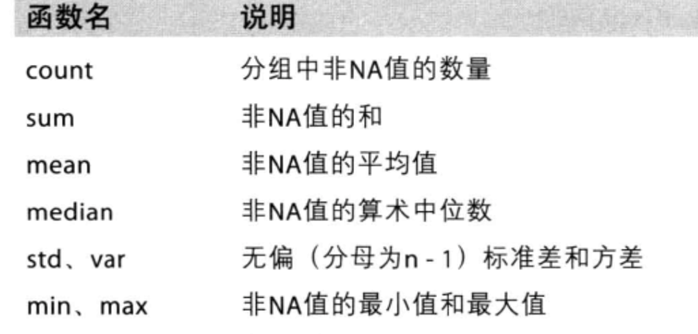

In [226]:
grouped.count() # country自动作为index

,Brand,Store Number,Store Name,Ownership Type,Street Address,City,State/Province,Postcode,Phone Number,Timezone,Longitude,Latitude
Country,,,,,,,,,,,,
AD,1,1,1,1,1,1,1,1,1,1,1,1
AE,144,144,144,144,144,144,144,24,78,144,144,144
AR,108,108,108,108,108,108,108,100,29,108,108,108
AT,18,18,18,18,18,18,18,18,17,18,18,18
AU,22,22,22,22,22,22,22,22,0,22,22,22
...,...,...,...,...,...,...,...,...,...,...,...,...
TT,3,3,3,3,3,3,3,3,0,3,3,3
TW,394,394,394,394,394,394,394,365,39,394,394,394
US,13608,13608,13608,13608,13608,13608,13608,13607,13122,13608,13608,13608


In [231]:
# 也可以对某列进行聚合
country_count = grouped['Brand'].count()
country_count # series

Country
AD        1
AE      144
AR      108
AT       18
AU       22
      ...  
TT        3
TW      394
US    13608
VN       25
ZA        3
Name: Brand, Length: 73, dtype: int64

In [230]:
country_count['CN']

2734

In [240]:
#获取分组之后的某一部分数据：
data.groupby(by=["Country","State/Province"])['Brand'].count()



Country  State/Province
AD       7                  1
AE       AJ                 2
         AZ                48
         DU                82
         FU                 2
                           ..
US       WV                25
         WY                23
VN       HN                 6
         SG                19
ZA       GT                 3
Name: Brand, Length: 545, dtype: int64

In [245]:
#对某几列数据进行分组：
data.groupby(by=["Country","State/Province"])[["Brand"]].count()


Brand
Country State/Province       
AD      7                   1
AE      AJ                  2
        AZ                 48
        DU                 82
        FU                  2
...                       ...
US      WV                 25
        WY                 23
VN      HN                  6
        SG                 19
ZA      GT                  3

[545 rows x 1 columns]

### 上面返回的是series类型，也可以返回dataframe类型
只要在Brand外加层[]表示取多列，这样就返回dataframe


In [242]:
# 这里先取了Brand列，如果此时还用by=["Country","State/Province"]
# 会报找不到列的错，此时需要传入原数据列表by=[data["Country"],data["State/Province"]]即可
data[["Brand"]].groupby(by=[data["Country"],data["State/Province"]]).count()


Brand
Country State/Province       
AD      7                   1
AE      AJ                  2
        AZ                 48
        DU                 82
        FU                  2
...                       ...
US      WV                 25
        WY                 23
VN      HN                  6
        SG                 19
ZA      GT                  3

[545 rows x 1 columns]

## 索引和复合索引
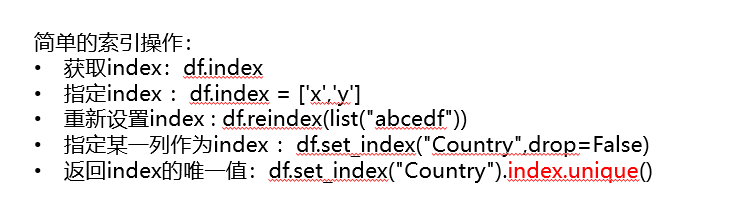

In [263]:
a = pd.DataFrame({'a': range(7),'b': range(7, 0, -1),'c': ['one','one','one','two','two','two', 'two'],'d': list("hjklmno")})
a

,a,b,c,d
0,0,7,one,h
1,1,6,one,j
2,2,5,one,k
3,3,4,two,l
4,4,3,two,m
5,5,2,two,n
6,6,1,two,o


In [264]:
# 获取index
a.index

RangeIndex(start=0, stop=7, step=1)

In [265]:
# 指定index
a.index=range(1,8)
a

,a,b,c,d
1,0,7,one,h
2,1,6,one,j
3,2,5,one,k
4,3,4,two,l
5,4,3,two,m
6,5,2,two,n
7,6,1,two,o


In [266]:
# 指定某一列作为index ：df.set_index("Country",drop=False)
a = a.set_index(['d','c']) # 多个索引要加列表
a

,,a,b
d,c,,
h,one,0,7
j,one,1,6
k,one,2,5
l,two,3,4
m,two,4,3
n,two,5,2
o,two,6,1


In [275]:
# 返回索引唯一值
b = a['a']
b

d  c  
h  one    0
j  one    1
k  one    2
l  two    3
m  two    4
n  two    5
o  two    6
Name: a, dtype: int64

In [276]:
b.index

MultiIndex([('h', 'one'),
            ('j', 'one'),
            ('k', 'one'),
            ('l', 'two'),
            ('m', 'two'),
            ('n', 'two'),
            ('o', 'two')],
           names=['d', 'c'])

## 复合索引——核心就是分多次进行索引
1. Series复合索引
2. DateFrame复合索引

Series复合索引

In [277]:
b

d  c  
h  one    0
j  one    1
k  one    2
l  two    3
m  two    4
n  two    5
o  two    6
Name: a, dtype: int64

In [283]:
# 如果想从内层索引开始取，使用swaplevel的方法
b=b.swaplevel() # level:相当于复合索引的里外层
b

c    d
one  h    0
     j    1
     k    2
two  l    3
     m    4
     n    5
     o    6
Name: a, dtype: int64

In [285]:
b['one']['h'] # series复合索引：只要分多次索引即可

0

DataFrame复合索引

In [287]:
a

,,a,b
d,c,,
h,one,0,7
j,one,1,6
k,one,2,5
l,two,3,4
m,two,4,3
n,two,5,2
o,two,6,1


In [290]:
a=a.swaplevel()
a

a  b
c   d      
one h  0  7
    j  1  6
    k  2  5
two l  3  4
    m  4  3
    n  5  2
    o  6  1

In [291]:
a.loc['one'].loc['j'] # DataFrame复合索引:多次用loc选择即可

a    1
b    6
Name: j, dtype: int64

In [294]:
a.loc['one'],type(a.loc['one'])

(   a  b
 d      
 h  0  7
 j  1  6
 k  2  5,
 pandas.core.frame.DataFrame)

In [319]:
# 绘制条形图
from matplotlib import pyplot as plt
import matplotlib
font = {'family':'Microsoft Yahei',
       'size':'10'}
matplotlib.rc("font",**font)

def draw_bar(data,name):
    fig = plt.figure(figsize=(20,8),dpi=80)
    x=list(range(len(data.index)))
    y=data.values
    plt.bar(x,y,width=0.5)
    plt.xticks(x,list(data.index))
    plt.xlabel(name)
    plt.ylabel("店铺数量")
    plt.show()

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9] [13608, 2734, 1468, 1237, 993, 901, 579, 394, 326, 298]


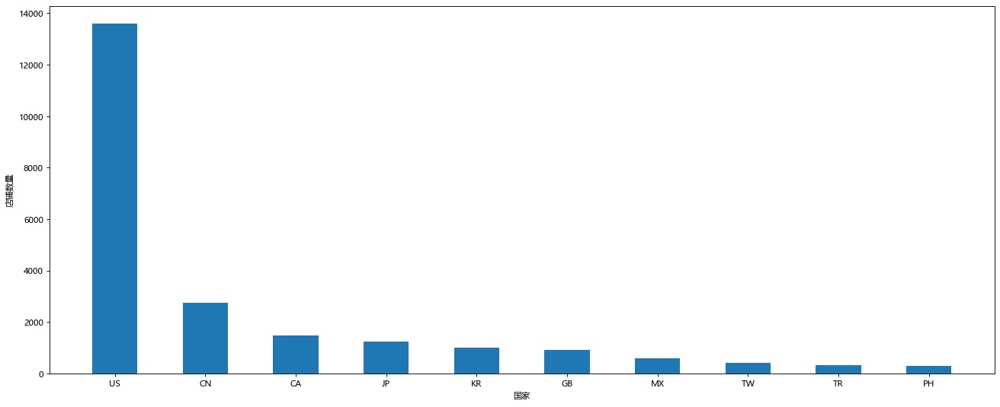

In [331]:
#使用matplotlib呈现出店铺总数排名前10的国家
country_count = data.groupby(by='Country')[["Brand"]].count()
country_count = country_count.sort_values(by='Brand',ascending=False)[:10]
draw_bar(country_count["Brand"],"国家")

In [321]:
#使用matplotlib呈现出每个中国每个城市的店铺数量
data

,Brand,Store Number,Store Name,Ownership Type,Street Address,City,State/Province,Country,Postcode,Phone Number,Timezone,Longitude,Latitude
0,Starbucks,47370-257954,"Meritxell, 96",Licensed,"Av. Meritxell, 96",Andorra la Vella,7,AD,AD500,376818720,GMT+1:00 Europe/Andorra,1.53,42.51
1,Starbucks,22331-212325,Ajman Drive Thru,Licensed,"1 Street 69, Al Jarf",Ajman,AJ,AE,NaN,NaN,GMT+04:00 Asia/Dubai,55.47,25.42
2,Starbucks,47089-256771,Dana Mall,Licensed,Sheikh Khalifa Bin Zayed St.,Ajman,AJ,AE,NaN,NaN,GMT+04:00 Asia/Dubai,55.47,25.39
3,Starbucks,22126-218024,Twofour 54,Licensed,Al Salam Street,Abu Dhabi,AZ,AE,NaN,NaN,GMT+04:00 Asia/Dubai,54.38,24.48
4,Starbucks,17127-178586,Al Ain Tower,Licensed,"Khaldiya Area, Abu Dhabi Island",Abu Dhabi,AZ,AE,NaN,NaN,GMT+04:00 Asia/Dubai,54.54,24.51
...,...,...,...,...,...,...,...,...,...,...,...,...,...
25595,Starbucks,21401-212072,Rex,Licensed,"141 Nguyễn Huệ, Quận 1, Góc đường Pasteur và L...",Thành Phố Hồ Chí Minh,SG,VN,70000,08 3824 4668,GMT+000000 Asia/Saigon,106.70,10.78
25596,Starbucks,24010-226985,Panorama,Licensed,"SN-44, Tòa Nhà Panorama, 208 Trần Văn Trà, Quận 7",Thành Phố Hồ Chí Minh,SG,VN,70000,08 5413 8292,GMT+000000 Asia/Saigon,106.71,10.72
25597,Starbucks,47608-253804,Rosebank Mall,Licensed,"Cnr Tyrwhitt and Cradock Avenue, Rosebank",Johannesburg,GT,ZA,2194,27873500159,GMT+000000 Africa/Johannesburg,28.04,-26.15
25598,Starbucks,47640-253809,Menlyn Maine,Licensed,"Shop 61B, Central Square, Cnr Aramist & Coroba...",Menlyn,GT,ZA,181,NaN,GMT+000000 Africa/Johannesburg,28.28,-25.79


In [329]:
CN_data = data[data['Country']=='CN']
count_CN_data = CN_data.groupby(by='City')[['Brand']].count()
count_CN_data = count_CN_data.sort_values(by='Brand',ascending=False)[:10]
count_CN_data


,Brand
City,
上海市,542
北京市,234
杭州市,117
深圳市,113
广州市,106
Hong Kong,104
成都市,98
苏州市,90
南京市,73


[0, 1, 2, 3, 4, 5, 6, 7, 8, 9] [542, 234, 117, 113, 106, 104, 98, 90, 73, 67]


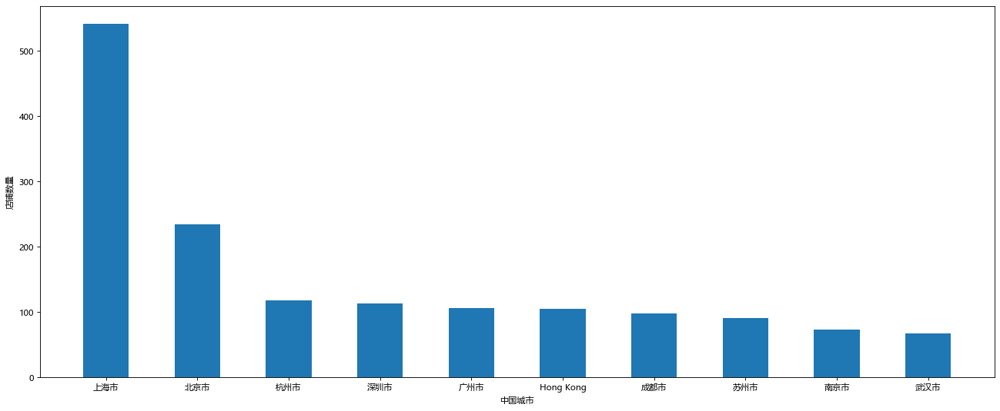

In [332]:
draw_bar(count_CN_data['Brand'],"中国城市")

In [337]:
def draw_barh(data,name):
    fig = plt.figure(figsize=(20,8),dpi=80)
    x=list(range(len(data.index)))
    y=data.values
    plt.barh(x,y,height=0.5)
    plt.yticks(x,list(data.index))
    plt.ylabel(name)
    plt.xlabel("店铺数量")
    plt.show()

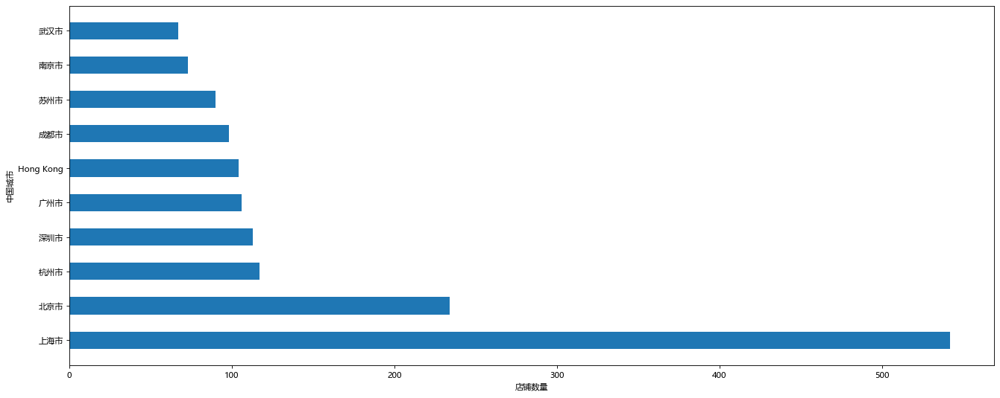

In [338]:
draw_barh(count_CN_data['Brand'],"中国城市")

# 时间序列用空再学